# Travel Destination Recommendation System Notebook

#### Authors
* 1 Dennis Mwanzia
* 2 Pamela Owino
* 3 Joshua Rwanda
* 4 Nelson Kemboi
* 5 Pauline Wambui
* 6 Kane Muendo
* 7 Ian Macharia


## Problem Statement

Tourists visiting Africa often struggle to find suitable travel destinations that align with their preferences, making it challenging to plan a satisfying trip within their budget and time constraints. 

Our main aim as AfricuraAI is to develop a machine learning model i.e. recommendation system that provides personalized recommendations for the best tourist destinations in Africa. By considering customer reviews, budget constraints, specific locations, available amenities, and residence type, the model aims to suggest the ideal tourist destination that aligns with the user's preferences.

By analyzing the text reviews along with the additional factors available in the dataset, the project seeks to build a model that accurately predicts the preferred tourist destination for both new and existing users. The model will take into account factors such as customer reviews, budget limitations, location preferences, amenities, physical attractions, and residence type to recommend the most suitable tourist destination in Africa.

The value of this project lies in its ability to address the real-world problem of providing personalized recommendations for tourists in their search for the best tourist destinations in Africa. By utilizing machine learning algorithms and analyzing a range of factors, the project aims to enhance the travel experience for users by suggesting destinations that meet their preferences and requirements.

## Objectives

The goal is to build a machine learning model that can accurately predict hotel ratings based on customer reviews, budget constraints, specific locations, and the type of residence. By analyzing the text reviews and incorporating additional factors, such as sentiment analysis, budget range, geographical distance, and residence type, the objective is to develop a robust model that can make accurate predictions for new, unseen hotels. The model will help users make informed decisions when selecting hotels by considering their preferences and constraints.

#### Specifics

> To create a Recommendation system that can be used to suggest travel destinations based on budget.

> To identify top destinations in Africa

> To foster customer loyalty and repeat customers, building long term relationships between customers and travel destinations. 

> To increase customer engagement  and satisfaction by providing comprehensive and accurate information about tourist destinations.

> To generate revenue by engaging travel destinations to have them listed on the site.

> To collect user information and feedback to improve the recommendations in the long run.

## Data Understanding

In [1]:
# We started by Importing the necessary libraries
import pandas as pd
import json
import glob
import re
import folium

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go


import warnings

warnings.filterwarnings('ignore')
sns.set_style('darkgrid')

In [2]:
#We created a function to read json files
def read_json_files(json_files):
    dfs = []
    for file in json_files:
        with open(file, encoding='utf-8') as f:
            json_data = json.load(f)
            df = pd.DataFrame(json_data)
            dfs.append(df)

    merged_df = pd.concat(dfs, ignore_index=True)
    return merged_df


In [3]:
json_files = json_files = ['../Data/botswana.json', '../Data/capeverde.json', '../Data/drc.json', '../Data/egypt.json',
                           '../Data/ethiopia.json', '../Data/ghana.json', '../Data/kenya.json','../Data/madagascar.json',
                           '../Data/malawi.json', '../Data/morocco.json', '../Data/namibia.json', '../Data/nigeria.json',
                           '../Data/rwanda.json','../Data/senegal.json', '../Data/seychelles.json', '../Data/south_africa.json',
                           '../Data/tanzania.json', '../Data/uganda.json', '../Data/zambia.json']
df = read_json_files(json_files)
df.head()

,id,type,category,subcategories,name,locationString,description,image,photoCount,awards,...,menuWebUrl,establishmentTypes,ownersTopReasons,guideFeaturedInCopy,rentalDescriptions,photos,bedroomInfo,bathroomInfo,bathCount,baseDailyRate
0,1171922,ATTRACTION,attraction,[Sights & Landmarks],Khwai River Bridge,"Okavango Delta, North-West District",None,https://media-cdn.tripadvisor.com/media/photo-...,24,[],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2513264,ATTRACTION,attraction,[Nature & Parks],Gaborone Game Reserve,"Gaborone, South-East District",None,https://media-cdn.tripadvisor.com/media/photo-...,84,[],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3247057,ATTRACTION,attraction,[Sights & Landmarks],ISKCON Gaborone,"Gaborone, South-East District",None,https://media-cdn.tripadvisor.com/media/photo-...,21,[],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,478934,ATTRACTION,attraction,[Nature & Parks],Serondela Reserve,"Chobe National Park, North-West District",This region of Chobe National Park is known as...,https://media-cdn.tripadvisor.com/media/photo-...,65,[],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,7931216,ATTRACTION,attraction,[Nature & Parks],Khutse Game Reserve,"Gaborone, South-East District",None,https://media-cdn.tripadvisor.com/media/photo-...,26,[],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Data Cleaning


Methodology for cleaning the dataset:

* Data Understanding: We took time to understand the data and its structure. We Identified the columns or attributes that are relevant for our analysis.

* Remove Irrelevant Data: We removed irrelevant columns for our analysis.

* Handle Missing Values.

* Standardize Formats.

* Remove Duplicates.

* Handle Outliers.

* Text Cleaning.

* Normalize and Categorize Data.

* Validate Data Integrity

### Data Understanding

In [4]:
# Checking the Data structure 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35836 entries, 0 to 35835
Data columns (total 65 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     35836 non-null  object 
 1   type                   35836 non-null  object 
 2   category               35836 non-null  object 
 3   subcategories          34497 non-null  object 
 4   name                   35836 non-null  object 
 5   locationString         34497 non-null  object 
 6   description            20129 non-null  object 
 7   image                  28495 non-null  object 
 8   photoCount             35836 non-null  int64  
 9   awards                 34497 non-null  object 
 10  rankingPosition        26570 non-null  float64
 11  rating                 26706 non-null  float64
 12  rawRanking             26570 non-null  float64
 13  phone                  24666 non-null  object 
 14  address                34494 non-null  object 
 15  ad

Our dataset contained 35836 rows and 65 columns. The 'photocount', 'numberofReviews', were of datatype integers while 'rankingPosition', 'rating','rawRanking', 'latitude', 'longitude' and 'ownersTopReasons' were of datatype float. All the other columns were of datatypes objects. Many of these columns had lots of missing data with 'ownersTopReasons' column having zero entries. The 'numberofReviews', 'reviews', 'id', 'type', 'category', 'name' and 'photocount' columns had zero missing values while all other columns had some number of missing values with one column having zero entries. Since this data was scrapped from tripadvisors website, it was expected that many columns will have all manner of inconsistencies. One of the goals of the project was to apply the extensive skills of data cleaning and hence this overly unclean data provided an rich opportunity for us to apply our skills. 

In [5]:
#prnt columns
df.columns

Index(['id', 'type', 'category', 'subcategories', 'name', 'locationString',
       'description', 'image', 'photoCount', 'awards', 'rankingPosition',
       'rating', 'rawRanking', 'phone', 'address', 'addressObj', 'localName',
       'localAddress', 'email', 'latitude', 'longitude', 'webUrl', 'website',
       'rankingString', 'rankingDenominator', 'neighborhoodLocations',
       'nearestMetroStations', 'ancestorLocations', 'ratingHistogram',
       'numberOfReviews', 'reviewTags', 'reviews', 'booking', 'offerGroup',
       'subtype', 'hotelClass', 'amenities', 'numberOfRooms', 'priceLevel',
       'priceRange', 'roomTips', 'checkInDate', 'checkOutDate', 'offers',
       'hotelClassAttribution', 'localLangCode', 'isClosed', 'isLongClosed',
       'openNowText', 'cuisines', 'mealTypes', 'dishes', 'features',
       'dietaryRestrictions', 'hours', 'menuWebUrl', 'establishmentTypes',
       'ownersTopReasons', 'guideFeaturedInCopy', 'rentalDescriptions',
       'photos', 'bedroomInfo', '

### Column descriptions 

•	id: Unique identifier for each destination.

•	type: Type of destination, i.e whether an attraction, an hotel etc.

•	category: Category of the destination. It describes the same features as type and hence a repetion of the type column.

•	subcategories: Subcategories associated with each type. i.e the kind of attraction or hotel type.

•	name: Name of the tourist destination.

•	locationString: String representation of the location of the tourist destinations in each country.

•	description: Description or details about the tourist destination.

•	image: Image associated with each tourist destination.

•	photoCount: Number of photos available for each destination.

•	awards: Awards received by each tourist destination.

•	rankingPosition: Ranking position of each destination within its location based on trip advisors trip ranking.

•	rating: Rating of each tourist destination.

•	rawRanking: Raw ranking of the destination.

•	phone: Phone number associated with each destination.

•	address: Address of the destination.

•	addressObj: Address information in object format.

•	localName: Local name of the destination.

•	localAddress: Local address of the destination.

•	localLangCode: Language code for the locals where each destination is located.

•	email: Email address associated with each destination.

•	latitude: Latitude coordinate of the destination's location.

•	longitude: Longitude coordinate of the destination's location.

•	webUrl: URL associated with the destination.

•	website: Website URL of the destination.

•	rankingString: Ranking information of the destination in string format.

•	rankingDenominator: Denominator for the ranking.

•	neighborhoodLocations: Other destinations with the target destination neighborhood.

•	nearestMetroStations: Nearest metro stations around the destination.

•	ancestorLocations: Ancestor locations of the destination.

•	ratingHistogram: Histogram data for the destination's ratings.

•	numberOfReviews: Number of reviews for the destination.

•	reviewTags: Tags associated with the reviews.

•	reviews: Reviews of the destination.

•	booking: Booking information for the destination.

•	offerGroup: Group offers associated with the destination.

•	subtype: Subtype or specific type of the destination.

•	hotelClass: Class or rating of a hotel item.

•	hotelClassAttribution: Attribution information for the hotel's class.

•	amenities: Amenities available at each destination.

•	numberOfRooms: Number of rooms available (for hotels).

•	priceLevel: Price level or range of the destination.

•	priceRange: Price range of the destination.

•	roomTips: Tips or recommendations for rooms (for hotels).

•	checkInDate: Date for check-in (for hotels).

•	checkOutDate: Date for check-out (for hotels).

•	offers: Offers associated with the destination.

•	guideFeaturedInCopy: Information about guides featuring the destination.

•	isClosed: Indicates if the destination is closed.

•	isLongClosed: Indicates if the destination has been closed for a long time.

•	openNowText: Text indicating if the item is currently open.

•	cuisines: Cuisines offered (for restaurants).

•	mealTypes: Types of meals available (for restaurants).

•	dishes: Dishes served (for restaurants).

•	features: Features or highlights of the destination.

•	dietaryRestrictions: Dietary restrictions or considerations.

•	hours: Operating hours of the destination.

•	menuWebUrl: URL for the menu (for restaurants).

•	establishmentTypes: Types of establishments.

•	ownersTopReasons: Top reasons provided by owners.

•	rentalDescriptions: Descriptions related to rentals.

•	photos: Photos associated with the item.

•	bedroomInfo: Information about bedrooms (for accommodations).

•	bathroomInfo: Information about bathrooms (for accommodations).

•	bathCount: Number of bathrooms (for accommodations).

•	baseDailyRate: Base daily rate (for accommodations).

#### Removing Irrelevant columns
After the initial data understanding, we realized that there were several columns and attributes that were not useful for our analysis because they either contained too much missing information, contained irrelevant information, were a repetition of other columns, or contained information that was not relevant for our analysis to achieve the target objectives. 
These included
**`image`**, 
**`photoCount`** This column had only 1667 out of 35836 values and also was of no significance to the model.
**`awards`** This was dropped because it was a list with non-null values. 
**`webUrl`**, This column was dropped because it contained the url for tripadvisor which did not have any relevant information      for the recommendation system.  
**`booking`**, **`offerGroup`**, These columns had 2912 rows out of 35836 and were also irrelevant hence we dropped them.
**`subtype`**, This column had 9264 rows out of 35836 hence we dropped it because of many missing values.
**`hotelClass`**, **`roomTips`**, **`checkInDate`**,**`checkOutDate`**, **`offers`** Even though these columns had 24817 non        null values, they had no relevant information for the recommendation system we were building hence we dropped it.
**`hotelClassAttribution`** This column had 7112 rows out of 35836 hence we dropped it because of many missing values.
**`localLangCode`** This column had 6758 rows out of 35836 hence we dropped it because of many missing values. 
**`isClosed`** This column had 416 rows out of 35836 hence we dropped it because of many missing values.
**`isLongClosed`** This column had 416 rows out of 35836 hence we dropped it because of many missing values.
**`openNowText`** This column had 184 rows out of 35836 hence we dropped it because of many missing values.
**`dietaryRestrictions`** This column had 416 rows out of 35836 hence we dropped it because of many missing values.
**`hours`**, This column had 84 rows out of 35836 hence we dropped it because of many missing values.
**`menuWebUrl`** This column had 43 rows out of 35836 hence we dropped it because of many missing values.
**`establishmentTypes`** This column had 416 rows or 1.1% of the dataset and hence we dropped it because of many missing values.
**`ownersTopReasons`** This column had zero entries and hence irrelevant in the analysis.
**`guideFeaturedInCopy`** This column had 77 non-null values out of 35836 values (0.2%) and since the data could not be imputed,    we dropped it. It is also of little significance in our recommendation system. 
**`rentalDescriptions`** This column had 1339 non-null values out of 35836 values (3.7%) and hence it contained limited amount of information for our analysis.  
**`photos`**. This column had 1339 non-null values out of 35836 values and hence it contained limited amount of information.  
We dropped all of these columns
**`phone`**, **`address`** , **`email`**, **`website`** **`neighborhoodLocations`**, **`nearestMetroStations`**, Even though we wanted to drop these columns, we realized that they contained useful information regarding contacts, websites and addresses of the destinations and would be of great importance when a user has selected their preferred destination. Moreover, we realized that the websites column could give us an indication of which countries had highest internet penetration, information that would be useful to our clients. 

In [6]:
# get valuecounts of phone column
df['photoCount'].value_counts()

0       8194
1       1857
2        937
3        820
4        743
        ... 
2824       1
1649       1
1293       1
1600       1
945        1
Name: photoCount, Length: 1667, dtype: int64

In [7]:
#Dropping irrelevant columns
columns_to_drop = ['image', 'photoCount', 'awards','localAddress',
                   'webUrl', 'website', 'ancestorLocations',
                   'booking', 'offerGroup', 'subtype', 'hotelClass', 'roomTips', 'checkInDate', 'category',
                   'checkOutDate', 'offers', 'hotelClassAttribution', 'localLangCode', 'isClosed', 'ratingHistogram',
                   'isLongClosed', 'openNowText', 'dietaryRestrictions', 'hours', 'menuWebUrl', 'localName', 
                   'establishmentTypes', 'ownersTopReasons', 'guideFeaturedInCopy', 'rentalDescriptions','photos']
df.drop(columns=columns_to_drop, inplace=True)
df.head()

,id,type,subcategories,name,locationString,description,rankingPosition,rating,rawRanking,phone,...,priceLevel,priceRange,cuisines,mealTypes,dishes,features,bedroomInfo,bathroomInfo,bathCount,baseDailyRate
0,1171922,ATTRACTION,[Sights & Landmarks],Khwai River Bridge,"Okavango Delta, North-West District",None,3.0,4.5,3.155229,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2513264,ATTRACTION,[Nature & Parks],Gaborone Game Reserve,"Gaborone, South-East District",None,7.0,3.5,2.956184,+267 318 4492,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3247057,ATTRACTION,[Sights & Landmarks],ISKCON Gaborone,"Gaborone, South-East District",None,5.0,4.5,2.974105,+267 71 767 711,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,478934,ATTRACTION,[Nature & Parks],Serondela Reserve,"Chobe National Park, North-West District",This region of Chobe National Park is known as...,3.0,4.5,3.029962,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,7931216,ATTRACTION,[Nature & Parks],Khutse Game Reserve,"Gaborone, South-East District",None,8.0,4.0,2.944026,None,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


After 

### Handling Missing values

In [8]:
# define a function that finds the percentage of missing values of columns with missing values

def missing_values_percentage(df):
    return df.isnull().sum() / len(df) * 100

column_percentages = missing_values_percentage(df)
columns_with_missing_values = column_percentages[column_percentages > 0]
columns_with_missing_values.sort_values(ascending=False)

mealTypes                98.839156
dishes                   98.839156
cuisines                 98.839156
features                 98.839156
baseDailyRate            96.461659
bathroomInfo             96.263534
bathCount                96.263534
bedroomInfo              96.263534
priceRange               60.545262
priceLevel               60.288537
numberOfRooms            52.349593
description              43.830227
email                    43.534435
phone                    31.169773
amenities                27.011943
rankingPosition          25.856680
rawRanking               25.856680
rankingDenominator       25.856680
rankingString            25.856680
rating                   25.477174
latitude                 16.000670
longitude                16.000670
address                   3.744838
subcategories             3.736466
reviewTags                3.736466
nearestMetroStations      3.736466
locationString            3.736466
addressObj                3.736466
neighborhoodLocation

In [9]:
above_90_missing_col = ['features', 'dishes', 'mealTypes', 'cuisines', 'baseDailyRate', 'bathCount', 'bathroomInfo', 'bedroomInfo']
df.drop(columns=above_90_missing_col, inplace=True)
df.head()

,id,type,subcategories,name,locationString,description,rankingPosition,rating,rawRanking,phone,...,rankingDenominator,neighborhoodLocations,nearestMetroStations,numberOfReviews,reviewTags,reviews,amenities,numberOfRooms,priceLevel,priceRange
0,1171922,ATTRACTION,[Sights & Landmarks],Khwai River Bridge,"Okavango Delta, North-West District",None,3.0,4.5,3.155229,None,...,5,[],[],45,[],[],NaN,NaN,NaN,NaN
1,2513264,ATTRACTION,[Nature & Parks],Gaborone Game Reserve,"Gaborone, South-East District",None,7.0,3.5,2.956184,+267 318 4492,...,25,[],[],115,"[{'text': 'eland', 'reviews': 7}, {'text': 'an...",[],NaN,NaN,NaN,NaN
2,3247057,ATTRACTION,[Sights & Landmarks],ISKCON Gaborone,"Gaborone, South-East District",None,5.0,4.5,2.974105,+267 71 767 711,...,25,[],[],23,[],[],NaN,NaN,NaN,NaN
3,478934,ATTRACTION,[Nature & Parks],Serondela Reserve,"Chobe National Park, North-West District",This region of Chobe National Park is known as...,3.0,4.5,3.029962,None,...,8,[],[],34,"[{'text': 'the river', 'reviews': 6}, {'text':...",[],NaN,NaN,NaN,NaN
4,7931216,ATTRACTION,[Nature & Parks],Khutse Game Reserve,"Gaborone, South-East District",None,8.0,4.0,2.944026,None,...,25,[],[],29,"[{'text': 'bucket shower', 'reviews': 5}, {'te...",[],NaN,NaN,NaN,NaN


#### **`price` columns**

Price is an important factor in calculating the similarity of places in this context. We should **impute** missing values in this columns instead of dropping them

In [10]:
#previewing price level and price range
df.head()[['priceLevel', 'priceRange', 'type']]

,priceLevel,priceRange,type
0,NaN,NaN,ATTRACTION
1,NaN,NaN,ATTRACTION
2,NaN,NaN,ATTRACTION
3,NaN,NaN,ATTRACTION
4,NaN,NaN,ATTRACTION


The price level column has only dollar signs and null values, therefore we will drop it. The price range column has a range in Kenya Shillings of the amount tourists can spend in the travel destination. We create two new columns with an upper and lower limit and then fill the missing valuea with the minimum amount if the type is attraction and the mean value if the type is hotel.

In [11]:
# Split the PriceRange column into UpperLimit and LowerLimit columns
df[['LowerPrice', 'UpperPrice']] = df['priceRange'].str.replace('KES', '').str.split(' - ', expand=True)
# Convert UpperLimit and LowerLimit columns to numeric  
df['LowerPrice'] = df['LowerPrice'].str.replace(',', '').astype(float)
df['UpperPrice'] = df['UpperPrice'].str.replace(',', '').astype(float)
# Fill missing values with minimum in 'LowerLimit' and 'UpperLimit' columns for type 'ATTRACTION'
df.loc[df['type'] == 'ATTRACTION', 'LowerPrice'] = df.loc[df['type'] == 'ATTRACTION', 'LowerPrice'].fillna(df['LowerPrice'].min())
df.loc[df['type'] == 'ATTRACTION', 'UpperPrice'] = df.loc[df['type'] == 'ATTRACTION', 'UpperPrice'].fillna(df['UpperPrice'].min())

# Fill missing values with mean in 'LowerLimit' and 'UpperLimit' columns for type 'HOTEL'
df.loc[df['type'] == 'HOTEL', 'LowerPrice'] = df.loc[df['type'] == 'HOTEL', 'LowerPrice'].fillna(df['LowerPrice'].mean())
df.loc[df['type'] == 'HOTEL', 'UpperPrice'] = df.loc[df['type'] == 'HOTEL', 'UpperPrice'].fillna(df['UpperPrice'].mean())
df.head()

,id,type,subcategories,name,locationString,description,rankingPosition,rating,rawRanking,phone,...,nearestMetroStations,numberOfReviews,reviewTags,reviews,amenities,numberOfRooms,priceLevel,priceRange,LowerPrice,UpperPrice
0,1171922,ATTRACTION,[Sights & Landmarks],Khwai River Bridge,"Okavango Delta, North-West District",None,3.0,4.5,3.155229,None,...,[],45,[],[],NaN,NaN,NaN,NaN,141.0,281.0
1,2513264,ATTRACTION,[Nature & Parks],Gaborone Game Reserve,"Gaborone, South-East District",None,7.0,3.5,2.956184,+267 318 4492,...,[],115,"[{'text': 'eland', 'reviews': 7}, {'text': 'an...",[],NaN,NaN,NaN,NaN,141.0,281.0
2,3247057,ATTRACTION,[Sights & Landmarks],ISKCON Gaborone,"Gaborone, South-East District",None,5.0,4.5,2.974105,+267 71 767 711,...,[],23,[],[],NaN,NaN,NaN,NaN,141.0,281.0
3,478934,ATTRACTION,[Nature & Parks],Serondela Reserve,"Chobe National Park, North-West District",This region of Chobe National Park is known as...,3.0,4.5,3.029962,None,...,[],34,"[{'text': 'the river', 'reviews': 6}, {'text':...",[],NaN,NaN,NaN,NaN,141.0,281.0
4,7931216,ATTRACTION,[Nature & Parks],Khutse Game Reserve,"Gaborone, South-East District",None,8.0,4.0,2.944026,None,...,[],29,"[{'text': 'bucket shower', 'reviews': 5}, {'te...",[],NaN,NaN,NaN,NaN,141.0,281.0


Some columns such as features, dishes, mealTypes, cuisines, baseDailyRate, bathCount, bathroomInfo, bedroomInfo have missing values above 90 percent. We opt to drop them.

The two new columns 'LowerPrice' and 'UpperPrice' have missing values. 

In [12]:
df.dropna(subset=['LowerPrice', 'UpperPrice'], inplace=True)

#### **`amenities` column**

In [13]:
# print out missing values in amenities
df['amenities'].isna().sum()

9385

>>>> There are some missing values in amenities. Lets inspect the `type` feature. It may help us fill these inconsistencies.

In [14]:
df['type'].value_counts()

HOTEL         24817
ATTRACTION     9264
RESTAURANT      121
Name: type, dtype: int64

Now we fill missing values in `amenities` with amenities you would typically find in that type of attraction

In [15]:
# Replace NaN values with "bathroom only" where type is "attraction"
df.loc[(df['type'] == 'RESTAURANT') & (df['amenities'].isna()), 'amenities'] = 'bathroom'
df.loc[(df['type'] == 'ATTRACTION') & (df['amenities'].isna()), 'amenities'] = 'bathroom '
# Define the value to populate empty lists
new_data = ['restaurant', 'bathroom', 'room']  # Replace with your desired data

# Populate empty lists using list comprehension
df['amenities'] = [new_data if isinstance(value, list) and not value else value for value in df['amenities']]
df.head()

,id,type,subcategories,name,locationString,description,rankingPosition,rating,rawRanking,phone,...,nearestMetroStations,numberOfReviews,reviewTags,reviews,amenities,numberOfRooms,priceLevel,priceRange,LowerPrice,UpperPrice
0,1171922,ATTRACTION,[Sights & Landmarks],Khwai River Bridge,"Okavango Delta, North-West District",None,3.0,4.5,3.155229,None,...,[],45,[],[],bathroom,NaN,NaN,NaN,141.0,281.0
1,2513264,ATTRACTION,[Nature & Parks],Gaborone Game Reserve,"Gaborone, South-East District",None,7.0,3.5,2.956184,+267 318 4492,...,[],115,"[{'text': 'eland', 'reviews': 7}, {'text': 'an...",[],bathroom,NaN,NaN,NaN,141.0,281.0
2,3247057,ATTRACTION,[Sights & Landmarks],ISKCON Gaborone,"Gaborone, South-East District",None,5.0,4.5,2.974105,+267 71 767 711,...,[],23,[],[],bathroom,NaN,NaN,NaN,141.0,281.0
3,478934,ATTRACTION,[Nature & Parks],Serondela Reserve,"Chobe National Park, North-West District",This region of Chobe National Park is known as...,3.0,4.5,3.029962,None,...,[],34,"[{'text': 'the river', 'reviews': 6}, {'text':...",[],bathroom,NaN,NaN,NaN,141.0,281.0
4,7931216,ATTRACTION,[Nature & Parks],Khutse Game Reserve,"Gaborone, South-East District",None,8.0,4.0,2.944026,None,...,[],29,"[{'text': 'bucket shower', 'reviews': 5}, {'te...",[],bathroom,NaN,NaN,NaN,141.0,281.0


In [16]:
# confirm no missing vals
df['amenities'].isna().sum()

0

In [17]:
review_df = pd.DataFrame(df, columns=['numberOfReviews',
                                                'reviewTags', 'reviews'])
review_df['reviewTags'][5]

[{'text': 'one night', 'reviews': 2},
 {'text': 'farm', 'reviews': 14},
 {'text': 'lucy', 'reviews': 13},
 {'text': 'botswana', 'reviews': 11},
 {'text': 'stay', 'reviews': 5},
 {'text': 'host', 'reviews': 5},
 {'text': 'dinner', 'reviews': 5},
 {'text': 'chickens', 'reviews': 2},
 {'text': 'nata', 'reviews': 2},
 {'text': 'campfire', 'reviews': 2},
 {'text': 'breakfast', 'reviews': 2},
 {'text': 'food', 'reviews': 4},
 {'text': 'gaborone', 'reviews': 2}]

In [18]:
#number of missing values in reviews column
df['reviewTags'].isnull().sum()

0

- The *'numberOfReviews'* column represent the number of reviews for each tourist destination.

- The *'reviews column'* has rows that have the same empty list '[ ]' value, the column does not provide any useful information or insights about the data. It does not contribute to the analysis or modeling process.

- The *'reviewTags'* column are tags associated with the reviews. It appears to contain a list of dictionaries, where each dictionary represents a review. Each dictionary has two keys: 'text' and 'reviews'. The 'text' key holds the review text, and the 'reviews' key holds the corresponding number of reviews.

- We can infer that it contains reviews or feedback related to a specific subject. Each review is represented by a dictionary with the review text and the number of reviews associated with it.

In [19]:
df.loc[:, 'reviewTags'] = df['reviewTags'].apply(lambda entries: [{'text': entry['text']} for entry in entries] if isinstance(entries, list) else [])
df['reviewTags'] = df['reviewTags'].apply(lambda tags: [tag['text'] for tag in tags])
df.head()

,id,type,subcategories,name,locationString,description,rankingPosition,rating,rawRanking,phone,...,nearestMetroStations,numberOfReviews,reviewTags,reviews,amenities,numberOfRooms,priceLevel,priceRange,LowerPrice,UpperPrice
0,1171922,ATTRACTION,[Sights & Landmarks],Khwai River Bridge,"Okavango Delta, North-West District",None,3.0,4.5,3.155229,None,...,[],45,[],[],bathroom,NaN,NaN,NaN,141.0,281.0
1,2513264,ATTRACTION,[Nature & Parks],Gaborone Game Reserve,"Gaborone, South-East District",None,7.0,3.5,2.956184,+267 318 4492,...,[],115,"[eland, animals]",[],bathroom,NaN,NaN,NaN,141.0,281.0
2,3247057,ATTRACTION,[Sights & Landmarks],ISKCON Gaborone,"Gaborone, South-East District",None,5.0,4.5,2.974105,+267 71 767 711,...,[],23,[],[],bathroom,NaN,NaN,NaN,141.0,281.0
3,478934,ATTRACTION,[Nature & Parks],Serondela Reserve,"Chobe National Park, North-West District",This region of Chobe National Park is known as...,3.0,4.5,3.029962,None,...,[],34,"[the river, hippos, chobe]",[],bathroom,NaN,NaN,NaN,141.0,281.0
4,7931216,ATTRACTION,[Nature & Parks],Khutse Game Reserve,"Gaborone, South-East District",None,8.0,4.0,2.944026,None,...,[],29,"[bucket shower, game reserve, latrine, hartebe...",[],bathroom,NaN,NaN,NaN,141.0,281.0


#### **`rankingDenominator`**, **`rankingString`**, **`rawRanking`**, **`rankingPosition`** and **`rating`**

In [20]:
# inspect cols
df.head()[['rankingDenominator', 'rankingString', 'rawRanking', 'rankingPosition', 'rating', 'type']]

,rankingDenominator,rankingString,rawRanking,rankingPosition,rating,type
0,5,#3 of 5 things to do in Okavango Delta,3.155229,3.0,4.5,ATTRACTION
1,25,#7 of 25 things to do in Gaborone,2.956184,7.0,3.5,ATTRACTION
2,25,#5 of 25 things to do in Gaborone,2.974105,5.0,4.5,ATTRACTION
3,8,#3 of 8 things to do in Chobe National Park,3.029962,3.0,4.5,ATTRACTION
4,25,#8 of 25 things to do in Gaborone,2.944026,8.0,4.0,ATTRACTION


The ranking string column contains ranking information in string format. To parse it, we need to create new columns from it by extracting the ranking type, location, numerator and denominator. We will then drop **`rankingDenominator`**, **`rankingString`**, **`rawRanking`** and **`rankingPosition`**

In [21]:
# Create new columns
df['RankingType'] = ""
df['Location'] = ""
df['Numerator'] = ""
df['Denominator'] = ""

# Iterate through the rows and extract the information
for index, row in df.iterrows():
    # Check if the value is NaN
    if pd.isnull(row['rankingString']):
        continue

    if match := re.match(
        r'#(\d+)\s+of\s+(\d+)\s+(.*?)\s+in\s+(.*?)$', row['rankingString']
    ):
        numerator = match.group(1)
        denominator = match.group(2)
        ranking_type = match.group(3)
        location = match.group(4)

        # Update the new columns
        df.at[index, 'RankingType'] = ranking_type
        df.at[index, 'Location'] = location
        df.at[index, 'Numerator'] = numerator
        df.at[index, 'Denominator'] = denominator

In [22]:
#inspect rankingtypes
df.RankingType.value_counts()

                             8517
Specialty lodging            7287
B&Bs / Inns                  6045
hotels                       4718
things to do                 3263
Outdoor Activities           1298
Tours                         693
Boat Tours & Water Sports     558
Transportation                532
hotel                         243
B&B / Inn                     239
Shopping                      162
Food & Drink                  161
Nightlife                     126
Spas & Wellness               115
places to eat                 105
Fun & Games                    73
Classes & Workshops            37
Nature & Parks                 12
Museums                         8
Concerts & Shows                7
Traveler Resources              1
Water & Amusement Parks         1
Sights & Landmarks              1
Name: RankingType, dtype: int64

After splitting the rankingString column to their respective elements. we observe below that the new column ranking type has some elements that are similar but grouped differently. 

We define a dictionary called 'mappings' that maps specific values in the 'RankingType' column to their corresponding updated values. Then, it replaces the values in the 'RankingType' column of the DataFrame 'df' using the defined mappings.

In [23]:
# Define the mappings to combine similar values
mappings = {
    'hotel': 'hotels',
    'B&B / Inn': 'B&Bs / Inns',
    'Sights & Landmarks': 'Nature & Parks',
    'Fun & Games': 'Outdoor Activities',
    'Boat Tours & Water Sports': 'Water & Amusement Parks',
    'Traveler Resources': 'Shopping',
    'Concerts & Shows': 'Nightlife',
    'Food & Drink': 'places to eat',
    'Nature & Parks': 'things to do',
    'Museums': 'things to do',
    'Tours' : 'things to do',
    'Outdoor Activities': 'things to do',
    'B&Bs / Inns': 'Specialty lodging'
}

# Replace the values in the 'Ranking Type' column
df['RankingType'] = df['RankingType'].replace(mappings)
df.head()

,id,type,subcategories,name,locationString,description,rankingPosition,rating,rawRanking,phone,...,amenities,numberOfRooms,priceLevel,priceRange,LowerPrice,UpperPrice,RankingType,Location,Numerator,Denominator
0,1171922,ATTRACTION,[Sights & Landmarks],Khwai River Bridge,"Okavango Delta, North-West District",None,3.0,4.5,3.155229,None,...,bathroom,NaN,NaN,NaN,141.0,281.0,things to do,Okavango Delta,3,5
1,2513264,ATTRACTION,[Nature & Parks],Gaborone Game Reserve,"Gaborone, South-East District",None,7.0,3.5,2.956184,+267 318 4492,...,bathroom,NaN,NaN,NaN,141.0,281.0,things to do,Gaborone,7,25
2,3247057,ATTRACTION,[Sights & Landmarks],ISKCON Gaborone,"Gaborone, South-East District",None,5.0,4.5,2.974105,+267 71 767 711,...,bathroom,NaN,NaN,NaN,141.0,281.0,things to do,Gaborone,5,25
3,478934,ATTRACTION,[Nature & Parks],Serondela Reserve,"Chobe National Park, North-West District",This region of Chobe National Park is known as...,3.0,4.5,3.029962,None,...,bathroom,NaN,NaN,NaN,141.0,281.0,things to do,Chobe National Park,3,8
4,7931216,ATTRACTION,[Nature & Parks],Khutse Game Reserve,"Gaborone, South-East District",None,8.0,4.0,2.944026,None,...,bathroom,NaN,NaN,NaN,141.0,281.0,things to do,Gaborone,8,25


In [24]:
# Splitting the rankingString column into three separate columns
df[['Rank', 'Total', 'Location']] = df['rankingString'].str.split(' of ', expand=True)
df[['Total', 'rankingtype']] = df['Total'].str.split(' ', n=1, expand=True)

# Cleaning up the columns
df['Rank'] = df['Rank'].str.replace('#', '')
df['Total'] = df['Total'].str.replace('things to do', '').str.replace('hotels', '').str.strip()

In [25]:
df['Total'] = df['Total'].str.replace(",", "")

In [26]:
df['Total'] = pd.to_numeric(df['Total'], errors='coerce')
df['Rank'] = pd.to_numeric(df['Rank'], errors='coerce')
# New feature we calculate the reciprocal since the Numerator/Denominator would result in lower ranked places
# getting higher values
df['regional_rating'] = (df['Total']/df['Rank']).astype(float)

In [27]:
# Define the mapping of types to ranking types
type_mapping = {
    'ATTRACTION': 'things to do',
    'HOTEL': np.random.choice(['hotel', 'Specialty lodging'], size=1)[0],
    # Add more types and their corresponding ranking types as needed
}

# Fill empty rows in RankingType based on type
df['RankingType'] = np.where((df['RankingType'] == '') & (df['type'].map(type_mapping) != ''), df['type'].map(type_mapping), df['RankingType'])

df['RankingType'] = df['RankingType'].fillna('VACATION_RENTAL').replace('VACATION_RENTAL', 'Specialty lodging')
df['RankingType'] = df['RankingType'].fillna('RESTAURANT').replace('RESTAURANT', 'places to eat')

In [28]:
df['rankingString'] = np.where(
    df['type'] == 'HOTEL',
    '#' + df.groupby('locationString').cumcount().add(1).astype(str) + ' of ' + df.groupby('locationString')['type'].transform('count').astype(str) + ' hotels in ' + df['locationString'],
    np.where(
        df['type'] == 'ATTRACTION',
        '#' + df.groupby('locationString').cumcount().add(1).astype(str) + ' of ' + df.groupby('locationString')['type'].transform('count').astype(str) + ' things to do in ' + df['locationString'],
        np.where(
            df['type'] == 'VACATION_RENTAL',
            '#' + df.groupby('locationString').cumcount().add(1).astype(str) + ' of ' + df.groupby('locationString')['type'].transform('count').astype(str) + ' vacation rentals in ' + df['locationString'],
            np.where(
                df['type'] == 'RESTAURANT',
                '#' + df.groupby('locationString').cumcount().add(1).astype(str) + ' of ' + df.groupby('locationString')['type'].transform('count').astype(str) + ' restaurants in ' + df['locationString'],
                '#' + df.groupby('locationString').cumcount().add(1).astype(str) + ' of ' + df.groupby('locationString')['type'].transform('count').astype(str) + ' ' + df['type'] + ' in ' + df['locationString']
            )
        )
    )
)

In [29]:
df['RankingType'].isna().sum()

0

Since 'rankingDenominator', 'rankingString', 'rawRanking', 'rankingPosition'  have a substantial ammount of missing values we will drop these columns.

#### **`rating` column**

In [30]:
#nulls in rating column
df['rating'].isna().sum()

7905

We will fill rating with 0 for now

In [31]:
df['rating'].fillna(0, inplace=True)

#### **`numberOfReviews`,`reviewTags` and `reviews` columns**

In [32]:
df[['numberOfReviews','reviewTags', 'reviews']]

,numberOfReviews,reviewTags,reviews
0,45,[],[]
1,115,"[eland, animals]",[]
2,23,[],[]
3,34,"[the river, hippos, chobe]",[]
4,29,"[bucket shower, game reserve, latrine, hartebe...",[]
...,...,...,...
35831,0,[],[]
35832,0,[],[]
35833,0,[],[]
35834,0,[],[]


- The *`numberOfReviews` column* represent the number of reviews for each tourist destination.

- The *`reviews` column* has rows that have the same empty list '[ ]' value, the column does not provide any useful information or insights about the data. It does not contribute to the analysis or modeling process.

- The *`reviewTags` column* are tags associated with the reviews. It appears to contain a list of dictionaries, where each dictionary represents a review. Each dictionary has two keys: 'text' and 'reviews'. The 'text' key holds the review text, and the 'reviews' key holds the corresponding number of reviews.

- We can infer that it contains reviews or feedback related to a specific subject. Each review is represented by a dictionary with the review text and the number of reviews associated with it.

-  We convert the 'reviewTags' column values from lists of dictionaries to a column with a list of strings by extracting  the 'text' values from the dictionaries.

In [33]:
total_sum = sum(1 for tags in df['reviewTags'] if tags == [])
total_sum

21461

In [34]:
#def clean_review_tags(df):
 #   """function to clean review tags"""
#    df.loc[:, 'reviewTags'] = df['reviewTags'].apply(lambda entries: [{'text': entry['text']} for entry in entries] if isinstance(entries, list) else [])
#    df.loc[:, 'reviewTags'] = df['reviewTags'].apply(lambda tags: [tag['text'] for tag in tags])
#    return df

#df_filtered = clean_review_tags(df)
#df_filtered.head()


Since the reviewTags column has many empty lists we will drop the column.

#### `longitude` and `latitude` columns

In [35]:
df.head()[['longitude','latitude', 'Location']]

,longitude,latitude,Location
0,NaN,NaN,None
1,NaN,NaN,None
2,25.89846,-24.65297,None
3,NaN,NaN,None
4,NaN,NaN,None


We Interpolate longitude and latitude values  because these geographic coordinates often exhibit a continuous pattern or follow a spatial relationship. Interpolation estimates the missing values based on the known data points and can provide a reasonable approximation of the actual values.

Here are a few reasons why we found interpolating longitude and latitude values to be beneficial:

- Spatial Continuity: Longitude and latitude values often have a spatial continuity, meaning that nearby locations tend to have similar values. Interpolation methods take advantage of this spatial relationship to estimate missing values based on neighboring known values.

- Data Preservation: Interpolation methods help preserve the overall pattern of the data by filling in missing values in a manner that aligns with the existing values. This can be useful for maintaining the spatial integrity of a dataset.

- Useful for Visualization and Analysis: Filling missing values using interpolation allows for better visualization and analysis of geographical data. Complete datasets facilitate mapping and spatial analysis.

In [36]:
def fill_missing_coordinates(df):
    df['longitude'] = df['longitude'].interpolate()
    df['latitude'] = df['latitude'].interpolate()
    df['longitude'] = df['longitude'].fillna(method='bfill')
    df['latitude'] = df['latitude'].fillna(method='bfill')
    return df
df = fill_missing_coordinates(df)

#### **`subcategories`**

In [37]:
df[['subcategories', 'type']]

,subcategories,type
0,[Sights & Landmarks],ATTRACTION
1,[Nature & Parks],ATTRACTION
2,[Sights & Landmarks],ATTRACTION
3,[Nature & Parks],ATTRACTION
4,[Nature & Parks],ATTRACTION
...,...,...
35831,[Bed and Breakfast],HOTEL
35832,[Bed and Breakfast],HOTEL
35833,[Specialty Lodging],HOTEL
35834,[Hotel],HOTEL


Filtering the DataFrame to include only rows where the `type` column is *VACATION_RENTAL* and assigning the missing values in the `subcategories` column of those rows with a list containing only the value `Specialty Lodging`.

In [38]:
df.loc[df['type'] == 'VACATION_RENTAL', 'subcategories'] = df.loc[df['type'] == 'VACATION_RENTAL', 'subcategories'].fillna('Specialty Lodging')

In [39]:
df['subcategories'].isna().sum()

0

#### `addressObj` column

In [40]:
#preview the data
df['addressObj'][50]

{'street1': None,
 'street2': None,
 'city': None,
 'state': None,
 'country': 'Botswana',
 'postalcode': None}

In [41]:
# drop missing values in the addressObj column
df.dropna(subset=['addressObj'], inplace=True)

In [42]:
# inspect missing vlue percentage
missing_values_percentage(df['addressObj'])

0.0

Extract the country value from the given dictionary in the 'addressObj' column, so that we can access the 'country' key of the dictionary.

In [43]:
df['country'] = df['addressObj'].apply(lambda x: x['country'] if isinstance(x, dict) else None)
df['city'] = df['addressObj'].apply(lambda x: x['city'] if isinstance(x, dict) else None)
df.dropna(subset=['city'], inplace=True)
df.head()

,id,type,subcategories,name,locationString,description,rankingPosition,rating,rawRanking,phone,...,RankingType,Location,Numerator,Denominator,Rank,Total,rankingtype,regional_rating,country,city
1,2513264,ATTRACTION,[Nature & Parks],Gaborone Game Reserve,"Gaborone, South-East District",None,7.0,3.5,2.956184,+267 318 4492,...,things to do,None,7,25,7.0,25.0,things to do in Gaborone,3.571429,Botswana,Gaborone
2,3247057,ATTRACTION,[Sights & Landmarks],ISKCON Gaborone,"Gaborone, South-East District",None,5.0,4.5,2.974105,+267 71 767 711,...,things to do,None,5,25,5.0,25.0,things to do in Gaborone,5.000000,Botswana,Gaborone
4,7931216,ATTRACTION,[Nature & Parks],Khutse Game Reserve,"Gaborone, South-East District",None,8.0,4.0,2.944026,None,...,things to do,None,8,25,8.0,25.0,things to do in Gaborone,3.125000,Botswana,Gaborone
5,7945044,ATTRACTION,[Sights & Landmarks],Kuminda Farm,"Francistown, North-East District",It's a small farm and we are into Argo tourism...,1.0,5.0,3.056681,+267 72 301 363,...,things to do,None,1,3,1.0,3.0,things to do in Francistown,3.000000,Botswana,Francistown
6,16864828,ATTRACTION,[Nature & Parks],Moremi Game Reserve,"Maun, Ngamiland East, North-West District",None,3.0,5.0,3.399518,None,...,things to do,None,3,6,3.0,6.0,things to do in Maun,2.000000,Botswana,Maun


In [44]:
df.columns

Index(['id', 'type', 'subcategories', 'name', 'locationString', 'description',
       'rankingPosition', 'rating', 'rawRanking', 'phone', 'address',
       'addressObj', 'email', 'latitude', 'longitude', 'rankingString',
       'rankingDenominator', 'neighborhoodLocations', 'nearestMetroStations',
       'numberOfReviews', 'reviewTags', 'reviews', 'amenities',
       'numberOfRooms', 'priceLevel', 'priceRange', 'LowerPrice', 'UpperPrice',
       'RankingType', 'Location', 'Numerator', 'Denominator', 'Rank', 'Total',
       'rankingtype', 'regional_rating', 'country', 'city'],
      dtype='object')

In [45]:
df['country'].value_counts()

South Africa                        3260
Ghana                               3146
Uganda                              2715
Egypt                               2417
Tanzania                            2351
Ethiopia                            2098
Namibia                             1867
Nigeria                             1710
Senegal                             1649
Rwanda                              1561
Madagascar                          1518
Kenya                               1165
Cape Verde                          1100
Zambia                              1048
Botswana                             913
Malawi                               821
Democratic Republic of the Congo     753
Morocco                              676
Seychelles                           659
Venezuela                             43
Caribbean                              1
Malaysia                               1
Georgia                                1
Spain                                  1
Portugal        

Remove outlier countries. These are countries outside Africa.

In [46]:
countries_to_remove = ['Spain', 'Portugal', 'Venezuela', 'Caribbean', 'Georgia']
df = df[~df['country'].isin(countries_to_remove)]

In [47]:
columns_to_drop = ['rankingPosition', 'addressObj', 'rawRanking', 'rankingString', 'rankingDenominator', 'reviews', 'numberOfRooms', 'priceLevel', 'priceRange', 'reviewTags', 'Numerator', 'Denominator', 'Location']
df.drop(columns=columns_to_drop, inplace=True)

In [48]:
df.head()

,id,type,subcategories,name,locationString,description,rating,phone,address,email,...,amenities,LowerPrice,UpperPrice,RankingType,Rank,Total,rankingtype,regional_rating,country,city
1,2513264,ATTRACTION,[Nature & Parks],Gaborone Game Reserve,"Gaborone, South-East District",None,3.5,+267 318 4492,Gaborone Botswana,None,...,bathroom,141.0,281.0,things to do,7.0,25.0,things to do in Gaborone,3.571429,Botswana,Gaborone
2,3247057,ATTRACTION,[Sights & Landmarks],ISKCON Gaborone,"Gaborone, South-East District",None,4.5,+267 71 767 711,"Masokwe 18678 West Phase 2, Gaborone Botswana",None,...,bathroom,141.0,281.0,things to do,5.0,25.0,things to do in Gaborone,5.000000,Botswana,Gaborone
4,7931216,ATTRACTION,[Nature & Parks],Khutse Game Reserve,"Gaborone, South-East District",None,4.0,None,Gaborone Botswana,None,...,bathroom,141.0,281.0,things to do,8.0,25.0,things to do in Gaborone,3.125000,Botswana,Gaborone
5,7945044,ATTRACTION,[Sights & Landmarks],Kuminda Farm,"Francistown, North-East District",It's a small farm and we are into Argo tourism...,5.0,+267 72 301 363,"Francistown/Nata Road Marobela Village, Franci...",kumindaculture@gmail.com,...,bathroom,141.0,281.0,things to do,1.0,3.0,things to do in Francistown,3.000000,Botswana,Francistown
6,16864828,ATTRACTION,[Nature & Parks],Moremi Game Reserve,"Maun, Ngamiland East, North-West District",None,5.0,None,"Maun, Ngamiland East Botswana",info@moremi.com,...,bathroom,141.0,281.0,things to do,3.0,6.0,things to do in Maun,2.000000,Botswana,Maun


In [49]:
# Replace empty strings with NaN
df = df.replace('', np.nan)

# Drop rows with NaN values
df = df.dropna()

#### `Numerator` and `Denominator` cols

The two described columns should be converted to int to be able to extract the information they represent i.e `regional_ranking`

In [50]:
df.tail()

,id,type,subcategories,name,locationString,description,rating,phone,address,email,...,amenities,LowerPrice,UpperPrice,RankingType,Rank,Total,rankingtype,regional_rating,country,city
35318,6427321,HOTEL,[Bed and Breakfast],Mumana Pleasure Resort,"Lusaka, Lusaka Province",Mumana Pleasure Resort is a 36 room resort wit...,2.0,+260 95 5291860,"Plot 38717 Great East Road, Lusaka 10100 Zambia",mukelabaism@yahoo.co.uk,...,"[Internet, Suites, Room service, Free parking,...",4923.000000,10549.000000,Specialty lodging,47.0,130.0,B&Bs / Inns in Lusaka,2.765957,Zambia,Lusaka
35326,6542212,HOTEL,[Bed and Breakfast],Lima Garden Guest House,"Lusaka, Lusaka Province",See why so many travelers make Lima Garden Gue...,2.5,+260 21 1236701,"Plot 109A Garden, Lusaka 10100 Zambia",limagardengh@zamnet.zm,...,"[Pool, Room service, Restaurant, Air condition...",13777.392428,23045.636246,Specialty lodging,46.0,130.0,B&Bs / Inns in Lusaka,2.826087,Zambia,Lusaka
35330,2666970,HOTEL,[Bed and Breakfast],Manda Hill Lodge,"Lusaka, Lusaka Province","Born in South Africa and taken to the world, N...",1.5,+260 96 2566733,18990 Corner of Mapepe and Parliament Road Oly...,info@accommodationlusaka.com,...,"[Internet, Kids Activities, Suites, Room servi...",6329.000000,12658.000000,Specialty lodging,48.0,130.0,B&Bs / Inns in Lusaka,2.708333,Zambia,Lusaka
35331,8118425,HOTEL,[Bed and Breakfast],BestBed Executive Lodge,"Ndola, Copperbelt Province",See why so many travelers make BestBed Executi...,4.0,+260 95 3938153,Plot 9547 Hillcrest Road 300 m off Ndola Kitwe...,info@bestbedlodge.com,...,"[Kids Activities, Room service, Free parking, ...",13777.392428,23045.636246,Specialty lodging,9.0,21.0,B&Bs / Inns in Ndola,2.333333,Zambia,Ndola
35340,1999874,HOTEL,[Specialty Lodging],Four Pillars Lodge,"Lusaka, Lusaka Province",Four Pillars Lodge is one of the leading provi...,3.0,+260 97 4783350,"Plot 36398 Alick Nkhata Road Mass Media Area, ...",kruger@zamtel.zm,...,"[Pool, Internet, Suites, Free Internet, Free p...",10689.000000,10830.000000,Specialty lodging,63.0,156.0,Specialty lodging in Lusaka,2.476190,Zambia,Lusaka


In [51]:
df.shape

(12891, 25)

In [52]:
# converting to csv
df.to_csv(r'../Data/clean_data.csv', index=False)

## EDA and Data Munging

In [53]:
pip install surprise

Note: you may need to restart the kernel to use updated packages.


In [54]:
# Importing necessary libraries
import pandas as pd
import numpy as np

import json
import glob
import re

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from surprise import Dataset, Reader, KNNBasic, SVD
from surprise.model_selection import train_test_split
from surprise import accuracy

import warnings
# Ignore future deprecation warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [55]:
clean_df = pd.read_csv('../data/clean_data.csv')

In [56]:
clean_df.head()

,id,type,subcategories,name,locationString,description,rating,phone,address,email,...,amenities,LowerPrice,UpperPrice,RankingType,Rank,Total,rankingtype,regional_rating,country,city
0,7945044,ATTRACTION,['Sights & Landmarks'],Kuminda Farm,"Francistown, North-East District",It's a small farm and we are into Argo tourism...,5.0,+267 72 301 363,"Francistown/Nata Road Marobela Village, Franci...",kumindaculture@gmail.com,...,bathroom,141.0,281.0,things to do,1.0,3.0,things to do in Francistown,3.00,Botswana,Francistown
1,1743605,ATTRACTION,"['Casinos & Gambling', 'Fun & Games']",Gaborone Sun,"Gaborone, South-East District",Botswana is where the white-hot Kalahari Deser...,4.0,+267 361 6000,"Plot 4727 Chuma Drive, Gaborone 016 Botswana",mb_bw_Reservations@za.suninternational.com,...,bathroom,141.0,281.0,things to do,4.0,25.0,things to do in Gaborone,6.25,Botswana,Gaborone
2,4162082,HOTEL,['Specialty Lodging'],Pelican Lodge & Camping,"Nata, Central District","The lodge is situated in Nata, Botswana. Clien...",3.0,+267 73 644 444,"A3 Road 6 kms south of Nata Village, Nata 0026...",reservations.pelicanlodge@thewildlodges.com,...,"['Pool', 'Internet', 'Free Internet', 'Free pa...",11533.0,13361.0,Specialty lodging,4.0,9.0,Specialty lodging in Nata,2.25,Botswana,Nata
3,1068835,HOTEL,['Bed and Breakfast'],Serowe Hotel,"Serowe, Central District","Set in beautiful gardens, the Serowe Hotel is ...",3.5,+267 463 0234,"Main Road Kgope Ward, Serowe Botswana",reservations@serowehotel.com,...,"['Pool', 'Internet', 'Free parking', 'Restaura...",6751.0,6892.0,Specialty lodging,1.0,7.0,B&Bs / Inns in Serowe,7.00,Botswana,Serowe
4,13477853,HOTEL,['Specialty Lodging'],Leopard Plains,"Maun, Ngamiland East, North-West District",Experience in the middle of the bushveld a lux...,4.5,+264 81 148 4240,"A3, Maun, Ngamiland East Botswana",leopardplains@gmx.com,...,"['Pool', 'Restaurant', 'Wifi', 'Breakfast incl...",32911.0,41632.0,Specialty lodging,10.0,81.0,Specialty lodging in Maun,8.10,Botswana,Maun


In [57]:
location = ['Chichiriviche']
filtered_data = clean_df[clean_df['locationString'].isin(location)]
len(filtered_data)

0

In [58]:
countries = ['Spain', 'Portugal', 'Venezuela', 'Carribbean', 'Georgia']
filtered_data = clean_df[clean_df['country'].isin(countries)]
len(filtered_data)

0

In [59]:
# Drop the filtered rows from the original DataFrame
clean_df = clean_df.drop(filtered_data.index)

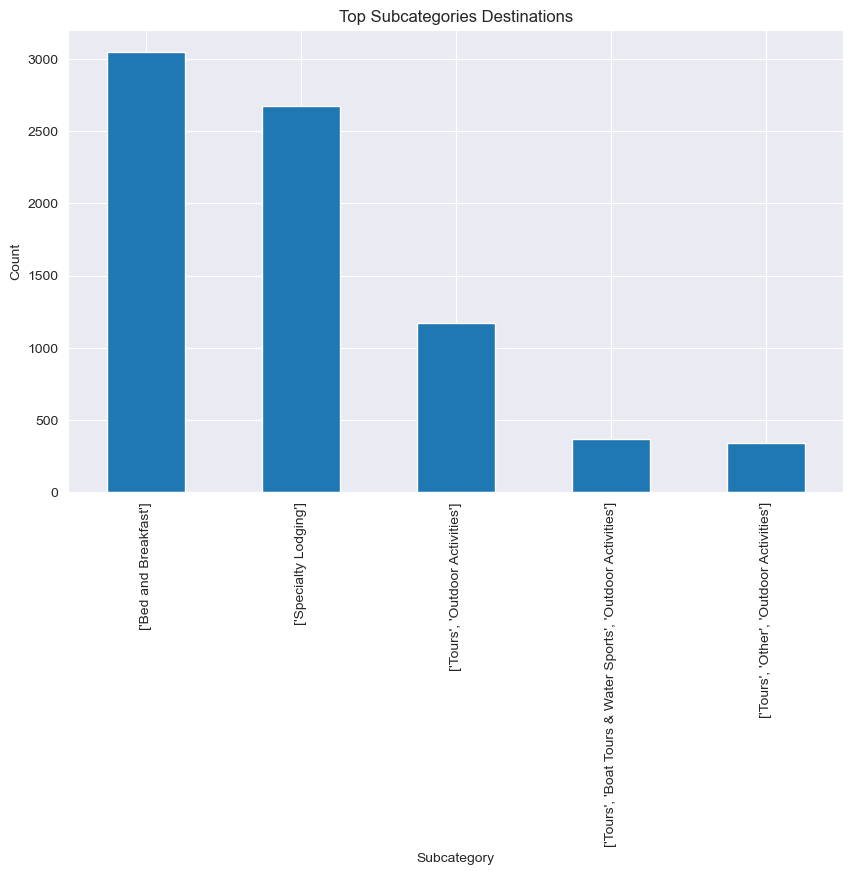

In [60]:
# Get value counts of production companies
subcategory_counts = clean_df['subcategories'].value_counts()

# Select the top 5 production companies
top_subcategories = subcategory_counts[1:6]

# Plot the top production companies
plt.figure(figsize=(10, 6))
top_subcategories.plot(kind='bar')
plt.title('Top Subcategories Destinations')
plt.xlabel('Subcategory')
plt.ylabel('Count')
plt.savefig('../Data/images/top_subcategories')
plt.show()

'Bed and Breakfast' and Specialty lodging are the top destination subcategories which are preferred by tourists.

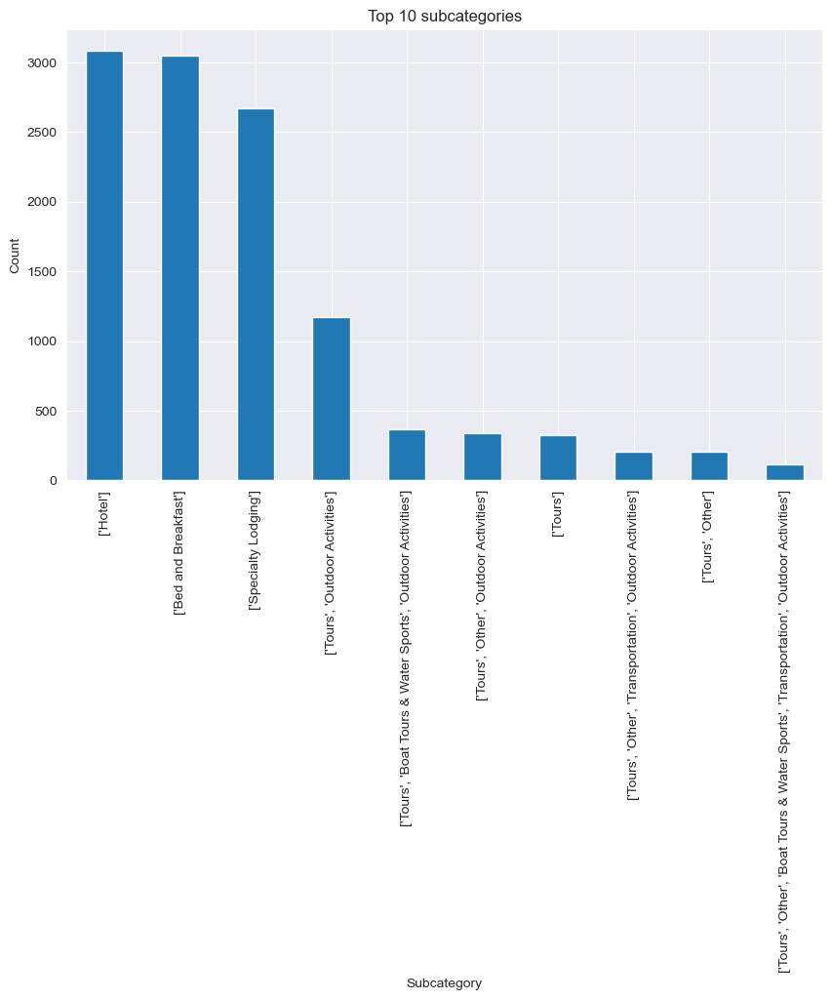

In [61]:
# Plotting 'Subcategoris' (top 10)
plt.figure(figsize=(10, 6))
top_10_subcategories = clean_df['subcategories'].explode().value_counts().head(10)
top_10_subcategories.plot(kind='bar')
plt.title('Top 10 subcategories')
plt.xlabel('Subcategory')
plt.ylabel('Count')
plt.savefig('../Data/images/top_10_subcategories_individually.png')
plt.show()

Columns to plot: Index(['id', 'rating', 'latitude', 'longitude', 'numberOfReviews',
       'LowerPrice', 'UpperPrice', 'Rank', 'Total', 'regional_rating'],
      dtype='object')


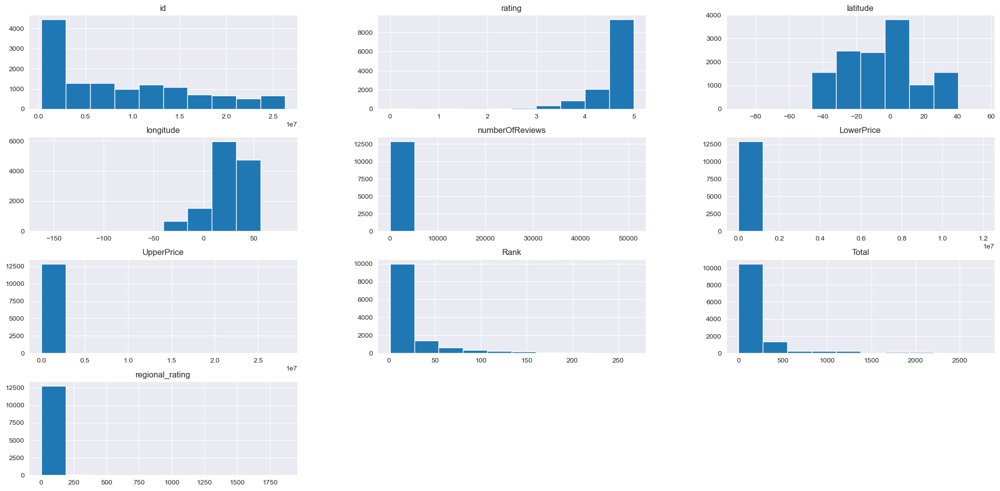

In [62]:
# Histogram plots for each data
# Select the numerical variables to plot
num_cols_to_plot = clean_df.select_dtypes(include=['int64', 'float64']).columns.drop([])
print("Columns to plot:",num_cols_to_plot )
# Create a histogram for each variable
clean_df[num_cols_to_plot].hist(figsize=(25, 12))
plt.savefig('../Data/images/Columnstoplot')
plt.show()

In [63]:
pip install stats

Note: you may need to restart the kernel to use updated packages.


In [64]:
from scipy.stats import zscore
from scipy import stats

In [65]:
pip install streamlit

Note: you may need to restart the kernel to use updated packages.


In [66]:
import streamlit as st
import folium

# Detect outliers using z-score method
zscore_threshold = 3  # Adjust this threshold based on your data and requirements
outliers = df[(df['latitude'] >= -35) & (df['latitude'] <= 37) & (df['longitude'] >= -25) & (df['longitude'] <= 60) &
                (np.abs(stats.zscore(df[['latitude', 'longitude']])) > zscore_threshold).any(axis=1)]

# Replace outliers with NaN values in the original DataFrame
df.loc[outliers.index, ['latitude', 'longitude']] = None

# Create a map centered at a specific location
map_center = [8, 20]
m = folium.Map(location=map_center, zoom_start=2)

# Add markers to the map for each location
for _, row in df.iterrows():
    lat, lon = row['latitude'], row['longitude']
    rating = row['rating']
    price = row['UpperPrice']
    ranking_type = row['RankingType']
    location_string = row['locationString']
    popup_text = f"Ranking Type: {ranking_type}, Location: {location_string}, Price: ${price}"

    if not pd.isnull(lat) and not pd.isnull(lon):
        folium.CircleMarker(
            location=[lat, lon],
            radius=5,
            color='blue',
            fill=True,
            fill_color='blue',
            popup=popup_text
        ).add_to(m)

# Display the map in Streamlit
st.markdown('<h1>Places to visit by Location</h1>', unsafe_allow_html=True)
st.markdown('<h3>Hover over the markers to see more details.</h3>', unsafe_allow_html=True)
st.write(m)


2023-07-13 06:15:01.919 
  command:

    streamlit run C:\Users\USER PC\anaconda3\lib\site-packages\ipykernel_launcher.py [ARGUMENTS]


We should begin by plotting a map of to show the distribution of our datapoints on the ground

In [67]:
# Define the map layout
layout = go.Layout(
    title='Places to visit by Location',
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        style='stamen-terrain',
        bearing=0,
        center=dict(
            lat=df['latitude'].median(),
            lon=df['longitude'].median()
        ),
        pitch=0,
        zoom=10
    ),
)
# Define the map data as a scatter plot of the coordinates
data = go.Scattermapbox(
    lat=df['latitude'],
    lon=df['longitude'],
    mode='markers',
    marker=dict(
        size=5,
        color=df['UpperPrice'],
        opacity=0.8
    ),
    text=['Price: ${}'.format(i) for i in df['UpperPrice']],
    hovertext = df.apply(lambda x: f"Ranking Type: ${x['RankingType']}, Name: {x['name']}", axis=1),
)
# Create the map figure and show it
fig = go.Figure(data=[data], layout=layout)
fig.show()

WARNING: the cell below uses folium and may be a bit taxing

In [68]:
# # Filter data by longitude and latitude range
data = df[(df['longitude'] >= -170) & (df['longitude'] <= 600) & (df['latitude'] >= -90) & (df['latitude'] <= 90)]

# # Create a map centered on the first point in the filtered data
map = folium.Map(location=[data.iloc[0]['latitude'], data.iloc[0]['longitude']])

# # Add markers for each point in the filtered data
for _, row in data.iterrows():
    folium.Marker(location=[row['latitude'], row['longitude']]).add_to(map)

# # Display the map
map

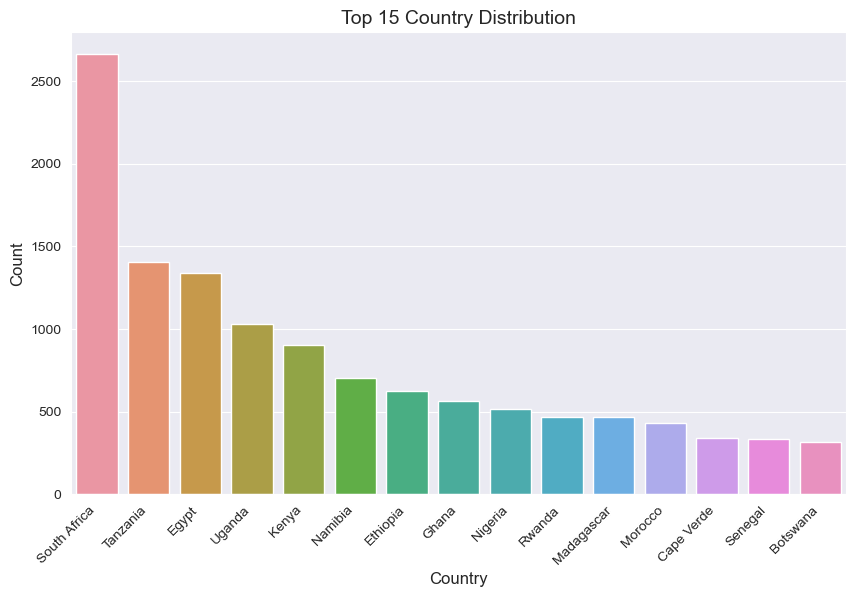

In [69]:
# Countplot of country distribution
country_counts = df['country'].value_counts().sort_values(ascending=False)
top_10_countries = country_counts.head(15)  # Select top 10 countries

sns.set_style("darkgrid")
plt.figure(figsize=(10, 6))  # Set the figure size
ax = sns.barplot(x=top_10_countries.index, y=top_10_countries.values)

ax.set_xlabel('Country', fontsize=12)  # Set x-axis label and fontsize
plt.setp(ax.get_xticklabels(), rotation=45, horizontalalignment='right')  # Rotate tick labels
ax.set_ylabel('Count', fontsize=12)  # Set y-axis label and fontsize
ax.set_title('Top 15 Country Distribution', fontsize=14)  # Set plot title

plt.show()

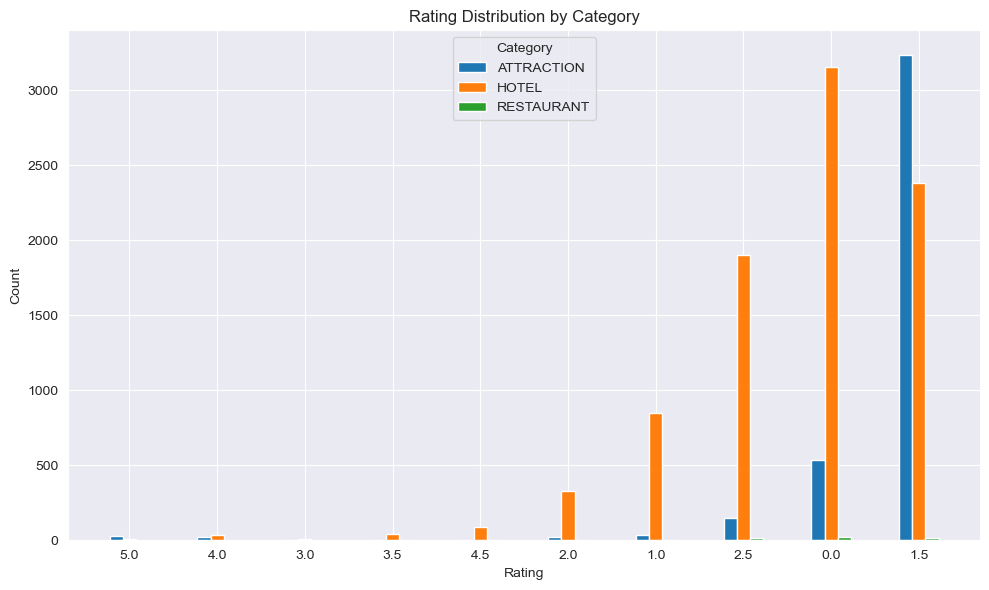

In [70]:
#visualizing ratings per tourist destination category 
# Group the ratings by category
grouped_data = df.groupby('type')['rating'].value_counts().unstack()
# Get unique categories and ratings
categories = df['type'].unique()
ratings = df['rating'].unique()
# Set the width of each bar
bar_width = 0.15
# Calculate the x position for each group of bars
x = np.arange(len(ratings))
# Create subplots
fig, ax = plt.subplots(figsize=(10, 6))
# Plot the bars for each category within each rating
for i, category in enumerate(categories):
    ax.bar(x + (i * bar_width), grouped_data.loc[category], width=bar_width, label=category)
    # Set the x-axis labels and ticks
    ax.set_xticks(x + ((len(categories) - 1) * bar_width) / 2)
    ax.set_xticklabels(ratings)
    ax.set_xlabel('Rating')
    ax.set_ylabel('Count')
    ax.set_title('Rating Distribution by Category')
    ax.legend(title='Category')
# Adjust the layout
plt.tight_layout()
# Show the plot
plt.show()

* From the chart above it can be seen that `hotel` category had higher ratings with an average rate of `4.0` followed by `attraction` while restaurants had lowest ratings based on categories over `3.5` 
* Despite having good ratings the same categories were rated poorly hith `hotel` and `attraction` trailing with rates of `1.5, 1.0` and `2.0` respectively. 

<function matplotlib.pyplot.show(close=None, block=None)>

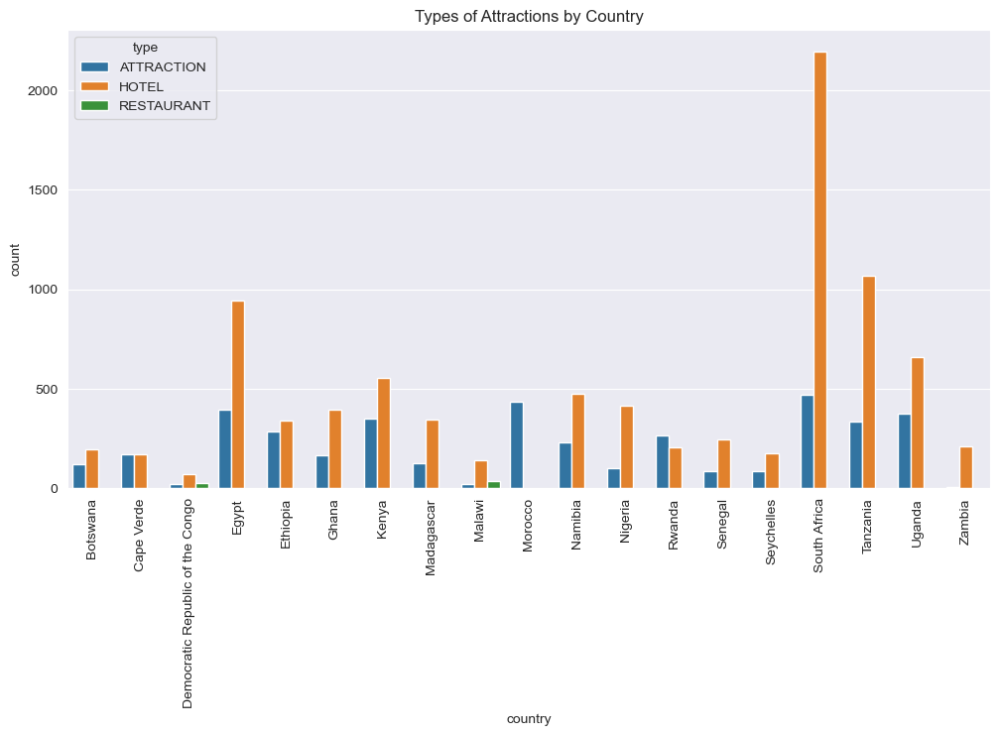

In [71]:
attractions_count = df.groupby(['country', 'type']).size().reset_index(name='count')

# Plot the count of attractions by country and category
plt.figure(figsize=(12, 6))
sns.barplot(x='country', y='count', hue='type', data=attractions_count)
# rotate x-axis labels
plt.xticks(rotation=90)
plt.title('Types of Attractions by Country')
plt.show

In [72]:
clean_df.columns

Index(['id', 'type', 'subcategories', 'name', 'locationString', 'description',
       'rating', 'phone', 'address', 'email', 'latitude', 'longitude',
       'neighborhoodLocations', 'nearestMetroStations', 'numberOfReviews',
       'amenities', 'LowerPrice', 'UpperPrice', 'RankingType', 'Rank', 'Total',
       'rankingtype', 'regional_rating', 'country', 'city'],
      dtype='object')

The columns `numerator` and `denomintor` are features that capture how popular a particular destination is in its `Location`. We can extract some information `regional_rating` by combining `numerator` and `denominator`

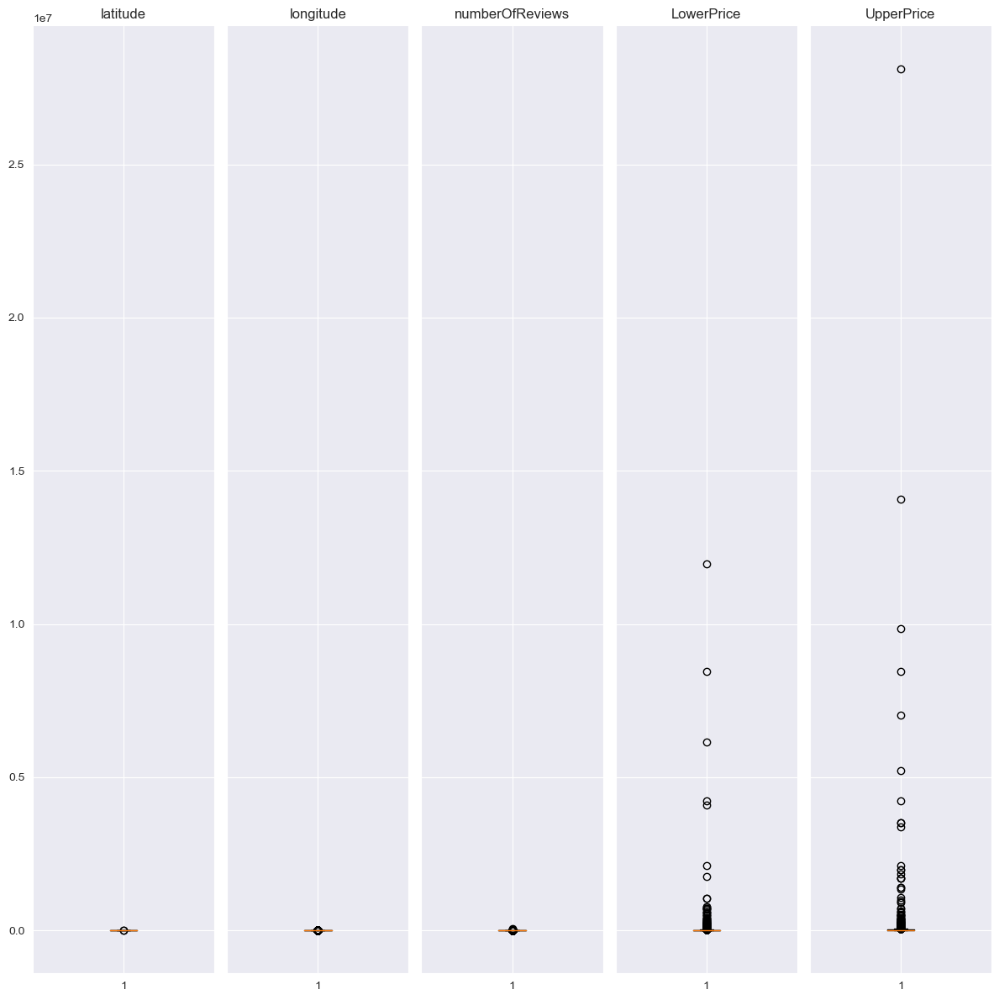

In [73]:
# Select the variables you want to plot

cols_to_plot = ['latitude', 'longitude', 'numberOfReviews', 'LowerPrice', 'UpperPrice']

######## Create a subplot grid
fig, axes = plt.subplots(nrows=1, ncols=len(cols_to_plot), figsize=(12, 12), sharey=True)

####### Create a boxplot for each variable in a separate subplot
for i, col in enumerate(cols_to_plot):
    axes[i].boxplot(clean_df[col])
    axes[i].set_title(col)
    axes[i].tick_params(axis='both', which='major')

# Adjust spacing between subplots
plt.tight_layout()
#save the figure
#plt.savefig(r"..Data/images/Outliers.png")
#Show the figure
plt.show()

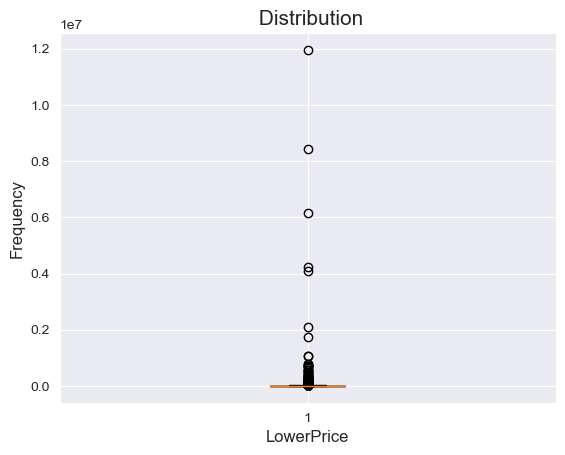

In [74]:
# Checking for outliers in the 'latitude' column
plt.boxplot(clean_df['LowerPrice'])
plt.xlabel("LowerPrice", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title(" Distribution", fontsize=15)
# save the figure
#plt.savefig(".data/images/popularity_outliers_plot")
plt.show()

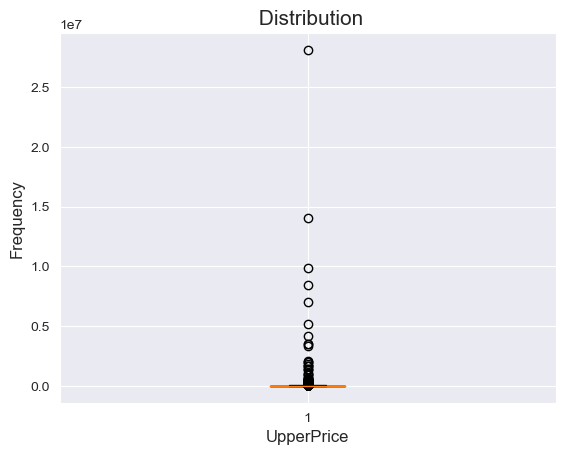

In [75]:
# Checking for outliers in the 'popularity' column
plt.boxplot(clean_df['UpperPrice'])
plt.xlabel("UpperPrice", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title(" Distribution", fontsize=15)
# save the figure
# plt.savefig(".data/images/popularity_outliers_plot")
plt.show()

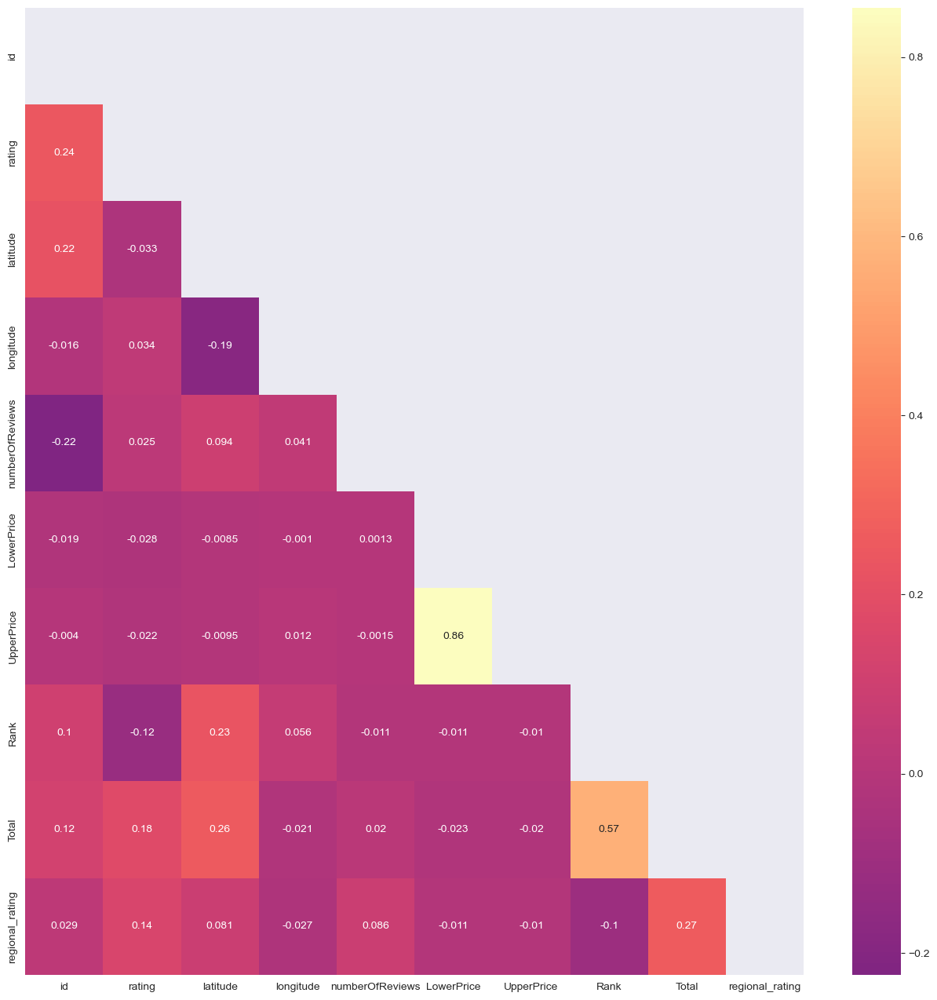

<Figure size 640x480 with 0 Axes>

In [76]:
## Multicollinearity

# Create a correlation matrix
corr_matrix = clean_df.corr()
# Create a fig size
plt.figure(figsize=(16, 16))
# Create a mask to show only the lower triangle
mask = np.zeros_like(corr_matrix, dtype=bool)
mask[np.triu_indices_from(mask)] = True
# Plot the heatmap with the lower triangle mask applied
sns.heatmap(corr_matrix, mask=mask, cmap='magma', center=0, annot=True)
# Show the plot
plt.show();
# Save figure
plt.savefig('../Data/images/multicollinearity.png')

## Modelling

Step 1: Prepare the data

Load the sample data into a suitable data structure, such as a pandas DataFrame. Preprocess the data if necessary, including handling missing values, converting categorical variables to numerical representations, and normalizing numerical features. Step 2: Split the data

Split the data into training and testing sets. Typically, an 80-20 split is used, but you can adjust the ratio based on the size of your dataset. Step 3: Choose recommendation models

There are several recommendation models you can choose from, depending on the nature of your data and the problem you want to solve. Here are a few popular models: Collaborative Filtering: This approach recommends items based on users' past behavior and preferences. Content-Based Filtering: This approach recommends items based on the similarity between items' characteristics and users' preferences. Matrix Factorization: This approach decomposes the user-item rating matrix to find latent factors and make recommendations. Neural Networks: You can also use deep learning models like neural networks for recommendation tasks. Step 4: Train and evaluate the models

For each model you choose, train it using the training set. Evaluate the trained model's performance using appropriate evaluation metrics such as precision, recall, or Mean Average Precision (MAP). Repeat the training and evaluation process for each model.

Step 5: Choose the best model

Compare the performance of the different models based on the evaluation metrics. Select the model that performs best according to your evaluation criteria.

Step 6: Fine-tune and optimize the chosen model

Once you have selected the best model, you can further fine-tune and optimize its hyperparameters using techniques like cross-validation or grid search.

Step 7: Deploy the recommendation system

Once you are satisfied with the performance of your chosen and optimized model, you can deploy it to make real-time recommendations.

In [77]:
clean_df.columns

Index(['id', 'type', 'subcategories', 'name', 'locationString', 'description',
       'rating', 'phone', 'address', 'email', 'latitude', 'longitude',
       'neighborhoodLocations', 'nearestMetroStations', 'numberOfReviews',
       'amenities', 'LowerPrice', 'UpperPrice', 'RankingType', 'Rank', 'Total',
       'rankingtype', 'regional_rating', 'country', 'city'],
      dtype='object')

In [78]:
clean_df[['id', 'rating','name', 'Rank', 'Total','regional_rating','subcategories', 'RankingType', 'locationString','country','city', 'LowerPrice', 'UpperPrice','type','description','phone', 'address', 'email','neighborhoodLocations', 'nearestMetroStations']]


,id,rating,name,Rank,Total,regional_rating,subcategories,RankingType,locationString,country,city,LowerPrice,UpperPrice,type,description,phone,address,email,neighborhoodLocations,nearestMetroStations
0,7945044,5.0,Kuminda Farm,1.0,3.0,3.000000,['Sights & Landmarks'],things to do,"Francistown, North-East District",Botswana,Francistown,141.000000,281.000000,ATTRACTION,It's a small farm and we are into Argo tourism...,+267 72 301 363,"Francistown/Nata Road Marobela Village, Franci...",kumindaculture@gmail.com,[],[]
1,1743605,4.0,Gaborone Sun,4.0,25.0,6.250000,"['Casinos & Gambling', 'Fun & Games']",things to do,"Gaborone, South-East District",Botswana,Gaborone,141.000000,281.000000,ATTRACTION,Botswana is where the white-hot Kalahari Deser...,+267 361 6000,"Plot 4727 Chuma Drive, Gaborone 016 Botswana",mb_bw_Reservations@za.suninternational.com,[],[]
2,4162082,3.0,Pelican Lodge & Camping,4.0,9.0,2.250000,['Specialty Lodging'],Specialty lodging,"Nata, Central District",Botswana,Nata,11533.000000,13361.000000,HOTEL,"The lodge is situated in Nata, Botswana. Clien...",+267 73 644 444,"A3 Road 6 kms south of Nata Village, Nata 0026...",reservations.pelicanlodge@thewildlodges.com,[],[]
3,1068835,3.5,Serowe Hotel,1.0,7.0,7.000000,['Bed and Breakfast'],Specialty lodging,"Serowe, Central District",Botswana,Serowe,6751.000000,6892.000000,HOTEL,"Set in beautiful gardens, the Serowe Hotel is ...",+267 463 0234,"Main Road Kgope Ward, Serowe Botswana",reservations@serowehotel.com,[],[]
4,13477853,4.5,Leopard Plains,10.0,81.0,8.100000,['Specialty Lodging'],Specialty lodging,"Maun, Ngamiland East, North-West District",Botswana,Maun,32911.000000,41632.000000,HOTEL,Experience in the middle of the bushveld a lux...,+264 81 148 4240,"A3, Maun, Ngamiland East Botswana",leopardplains@gmx.com,[],[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12886,6427321,2.0,Mumana Pleasure Resort,47.0,130.0,2.765957,['Bed and Breakfast'],Specialty lodging,"Lusaka, Lusaka Province",Zambia,Lusaka,4923.000000,10549.000000,HOTEL,Mumana Pleasure Resort is a 36 room resort wit...,+260 95 5291860,"Plot 38717 Great East Road, Lusaka 10100 Zambia",mukelabaism@yahoo.co.uk,[],[]
12887,6542212,2.5,Lima Garden Guest House,46.0,130.0,2.826087,['Bed and Breakfast'],Specialty lodging,"Lusaka, Lusaka Province",Zambia,Lusaka,13777.392428,23045.636246,HOTEL,See why so many travelers make Lima Garden Gue...,+260 21 1236701,"Plot 109A Garden, Lusaka 10100 Zambia",limagardengh@zamnet.zm,[],[]
12888,2666970,1.5,Manda Hill Lodge,48.0,130.0,2.708333,['Bed and Breakfast'],Specialty lodging,"Lusaka, Lusaka Province",Zambia,Lusaka,6329.000000,12658.000000,HOTEL,"Born in South Africa and taken to the world, N...",+260 96 2566733,18990 Corner of Mapepe and Parliament Road Oly...,info@accommodationlusaka.com,[],[]
12889,8118425,4.0,BestBed Executive Lodge,9.0,21.0,2.333333,['Bed and Breakfast'],Specialty lodging,"Ndola, Copperbelt Province",Zambia,Ndola,13777.392428,23045.636246,HOTEL,See why so many travelers make BestBed Executi...,+260 95 3938153,Plot 9547 Hillcrest Road 300 m off Ndola Kitwe...,info@bestbedlodge.com,[],[]


## 1. Prepare the data
* Dealing with outliers in the numerical columns

In [79]:
pip install --upgrade scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [80]:
pip install --upgrade threadpoolctl

Note: you may need to restart the kernel to use updated packages.


In [81]:
from sklearn.cluster import KMeans

# Select the numerical features for clustering
numerical_columns = clean_df.select_dtypes(include=[np.number]).columns
numerical_data = clean_df[numerical_columns]

# Apply K-means clustering
kmeans = KMeans(n_clusters=3)  # Specify the number of clusters
kmeans.fit(numerical_data)

# Assign each data point to a cluster
labels = kmeans.labels_

# Identify the cluster with the outliers
outlier_cluster = np.argmax(np.bincount(labels))

# Remove the rows belonging to the outlier cluster
clean_df = clean_df[labels != outlier_cluster]

In [82]:
clean_df.shape

(6687, 25)

### Cleaning and transforming textual data

In [83]:
textual_data = clean_df[['subcategories', 'RankingType', 'locationString', 'country', 'city', 'amenities']]
textual_data

,subcategories,RankingType,locationString,country,city,amenities
0,['Sights & Landmarks'],things to do,"Francistown, North-East District",Botswana,Francistown,bathroom
4,['Specialty Lodging'],Specialty lodging,"Maun, Ngamiland East, North-West District",Botswana,Maun,"['Pool', 'Restaurant', 'Wifi', 'Breakfast incl..."
5,['Specialty Lodging'],Specialty lodging,"Kachikau, Chobe National Park, North-West Dist...",Botswana,Kachikau,"['Restaurant', 'Bar/Lounge', 'Wifi', 'Board Ga..."
6,['Specialty Lodging'],Specialty lodging,"Kasane, Chobe National Park, North-West District",Botswana,Kasane,"['Suites', 'Wifi', 'Public Wifi', 'Free Wifi',..."
9,['Bed and Breakfast'],Specialty lodging,"Gaborone, South-East District",Botswana,Gaborone,"['Pool', 'Internet', 'Suites', 'Free Internet'..."
...,...,...,...,...,...,...
12873,['Specialty Lodging'],Specialty lodging,"Livingstone, Southern Province",Zambia,Livingstone,"['Pool', 'Wifi', 'Public Wifi', 'Breakfast inc..."
12880,['Bed and Breakfast'],Specialty lodging,"Petauke, Eastern Province",Zambia,Petauke,"['restaurant', 'bathroom', 'room']"
12881,['Bed and Breakfast'],Specialty lodging,"Lusaka, Lusaka Province",Zambia,Lusaka,"['Internet', 'Free Internet', 'Free parking', ..."
12882,['Hotel'],hotels,"Lusaka, Lusaka Province",Zambia,Lusaka,"['Pool', 'Internet', 'Suites', 'Room service',..."


In [85]:
import pandas as pd
from sklearn.preprocessing import MultiLabelBinarizer

# Load the data
data_1 = textual_data

# Perform one-hot encoding for 'subcategories'
mlb = MultiLabelBinarizer()
subcategories_encoded = pd.DataFrame(mlb.fit_transform(data_1['subcategories']), columns=mlb.classes_)
amenities_encoded = pd.DataFrame(mlb.fit_transform(data_1['amenities']), columns=mlb.classes_)

# Concatenate the encoded columns with the original DataFrame
data_encoded = pd.concat([data_1, subcategories_encoded, amenities_encoded], axis=1)

# Remove unwanted characters from column names
data_encoded.columns = [re.sub(r'[^a-zA-Z0-9\s]+', '', column) if column.strip() else column for column in data_encoded.columns]

# Remove empty strings and single characters
data_encoded.columns = [column.strip() for column in data_encoded.columns if column.strip()]

# Ensure the number of columns matches with the original dataset
if len(data_encoded.columns) != len(textual_data.columns):
    diff = len(textual_data.columns) - len(data_encoded.columns)
    if diff > 0:
        data_encoded = data_encoded.reindex(columns=list(data_encoded.columns) + [''] * diff, fill_value='')

# Update the original dataset with the modified columns from data_encoded
# Update the original dataset with the modified columns from data_encoded
textual_data = textual_data.apply(lambda row: row.combine_first(data_encoded.loc[row.name]), axis=1)
# Print the updated dataset
textual_data



# Drop the original 'subcategories' and 'amenities' columns
# data_1.drop(['subcategories', 'amenities'], axis=1, inplace=True)


# Remove empty strings and single characters
#data_encoded.columns = [column.strip() for column in data_encoded.columns if column.strip()]

# Append empty strings to the column names to match the original length
#if len(data_encoded.columns) < len(textual_data.columns):
  #  diff = len(textual_data.columns) - len(data_encoded.columns)
  #  data_encoded.columns = data_encoded.columns + [''] * diff

# Perform any additional preprocessing steps or feature engineering if needed
# ...

# Now you can use the 'data_encoded' DataFrame for modeling


ValueError: Length mismatch: Expected axis has 114 elements, new values have 97 elements

In [86]:
data_encoded.columns

Index(['subcategories', 'RankingType', 'locationString', 'country', 'city',
       'amenities', ' ', '', '', '',
       ...
       'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z'],
      dtype='object', length=114)

In [87]:
# Create a map to concatenate the modified data_encoded with the original dataset
data_map = data_encoded.set_index(textual_data.index).to_dict(orient='index')

# Update the original dataset with the modified columns from data_encoded
for index, row in textual_data.iterrows():
    data_id = row['id']
    if data_id in data_map:
        updated_row = data_map[data_id]
        for column in data_encoded.columns:
            textual_data.at[index, column] = updated_row.get(column, None)

# Print the updated dataset
textual_data


ValueError: Length mismatch: Expected 9514 rows, received array of length 6687

## Baseline Model

In [89]:
# Load the data into Surprise Dataset format
reader = Reader(rating_scale=(1, 5))
data = Dataset.load_from_df(clean_df[['id', 'rating', 'Rank']], reader)

# Split the data into train and test sets
trainset, testset = train_test_split(data, test_size=0.2, random_state=42)

# Train the model
model = KNNBasic(random_state=42)
model.fit(trainset)

# Evaluate the model
predictions1 = model.test(testset)
accuracy1 = accuracy.rmse(predictions1)

Computing the msd similarity matrix...
Done computing similarity matrix.
RMSE: 44.7638


Root Mean Square Error (RMSE) is a measure of the model's prediction accuracy. In the context of recommendation systems, it quantifies the average difference between the predicted ratings and the actual ratings given by the users. A lower RMSE value indicates better model pemrformance. In this case, the RMSE is 44.7638, which suggests that the model's predictions have a relatively high level of error.

In [90]:
for prediction in predictions1:
    print(f"Predicted rating: {prediction.est:.2f}")
    print(f"Actual rating: {prediction.r_ui:.2f}")
    print("---")

Predicted rating: 5.00
Actual rating: 5.00
---
Predicted rating: 5.00
Actual rating: 31.00
---
Predicted rating: 5.00
Actual rating: 4.00
---
Predicted rating: 5.00
Actual rating: 14.00
---
Predicted rating: 5.00
Actual rating: 9.00
---
Predicted rating: 5.00
Actual rating: 4.00
---
Predicted rating: 5.00
Actual rating: 64.00
---
Predicted rating: 5.00
Actual rating: 4.00
---
Predicted rating: 5.00
Actual rating: 1.00
---
Predicted rating: 5.00
Actual rating: 10.00
---
Predicted rating: 5.00
Actual rating: 1.00
---
Predicted rating: 5.00
Actual rating: 1.00
---
Predicted rating: 5.00
Actual rating: 22.00
---
Predicted rating: 5.00
Actual rating: 33.00
---
Predicted rating: 5.00
Actual rating: 1.00
---
Predicted rating: 5.00
Actual rating: 140.00
---
Predicted rating: 5.00
Actual rating: 2.00
---
Predicted rating: 5.00
Actual rating: 4.00
---
Predicted rating: 5.00
Actual rating: 7.00
---
Predicted rating: 5.00
Actual rating: 11.00
---
Predicted rating: 5.00
Actual rating: 3.00
---
Pred

In [91]:
threshold = 3  # Define the threshold for positive predictions

true_positives = 0
false_positives = 0
false_negatives = 0

for prediction in predictions1:
    if prediction.est >= threshold:
        if prediction.r_ui >= threshold:
            true_positives += 1
        else:
            false_positives += 1
    elif prediction.r_ui >= threshold:
        false_negatives += 1

precision1 = true_positives / (true_positives + false_positives)
recall1 = true_positives / (true_positives + false_negatives)

print(f"Precision: {precision1:.2f}")
print(f"Recall: {recall1:.2f}")

Precision: 0.76
Recall: 1.00


Precision: Precision measures the proportion of recommended items that are relevant or useful to the user. A precision of 0.76 means that approximately 76% of the recommended items are relevant to the user's preferences or needs. In other words, out of all the items recommended, 76% are expected to be items that the user will find useful or enjoy.

Recall: Recall measures the proportion of relevant items that are successfully recommended. A recall of 1.00 indicates that the system has successfully recommended all the relevant items to the user. In other words, the recommendation system has not missed any items that the user would have found useful.

In [96]:
# Load the data into Surprise Dataset format
reader = Reader(rating_scale=(1, 5))
data = Dataset.load_from_df(clean_df[['id', 'rating', 'Rank']], reader)

# Split the data into train and test sets
trainset, testset = train_test_split(data, test_size=0.2, random_state=42)

# Train the model
model2 = SVD(random_state=42)
model2.fit(trainset)

# Evaluate the model
predictions2 = model2.test(testset)
accuracy2 = accuracy.rmse(predictions2)

RMSE: 44.7638


RMSE of 44.7638 means that, on average, the predictions made by the model have an error of approximately 44.7638 units. The RMSE gives you an idea of how well your model's predictions align with the true values. The lower the RMSE, the better the model's performance.

To further evaluate the significance of the RMSE value, it's important to consider the scale and context of your specific problem. Additionally, comparing the RMSE to the range of the target variable can provide insights into the relative performance of the model.

In [97]:
for prediction in predictions2:
    print(f"Predicted rating: {prediction.est:.2f}")
    print(f"Actual rating: {prediction.r_ui:.2f}")
    print("---")

Predicted rating: 5.00
Actual rating: 5.00
---
Predicted rating: 5.00
Actual rating: 31.00
---
Predicted rating: 5.00
Actual rating: 4.00
---
Predicted rating: 5.00
Actual rating: 14.00
---
Predicted rating: 5.00
Actual rating: 9.00
---
Predicted rating: 5.00
Actual rating: 4.00
---
Predicted rating: 5.00
Actual rating: 64.00
---
Predicted rating: 5.00
Actual rating: 4.00
---
Predicted rating: 5.00
Actual rating: 1.00
---
Predicted rating: 5.00
Actual rating: 10.00
---
Predicted rating: 5.00
Actual rating: 1.00
---
Predicted rating: 5.00
Actual rating: 1.00
---
Predicted rating: 5.00
Actual rating: 22.00
---
Predicted rating: 5.00
Actual rating: 33.00
---
Predicted rating: 5.00
Actual rating: 1.00
---
Predicted rating: 5.00
Actual rating: 140.00
---
Predicted rating: 5.00
Actual rating: 2.00
---
Predicted rating: 5.00
Actual rating: 4.00
---
Predicted rating: 5.00
Actual rating: 7.00
---
Predicted rating: 5.00
Actual rating: 11.00
---
Predicted rating: 5.00
Actual rating: 3.00
---
Pred

In the code below, we will iterate over the predictions and increment the corresponding counters based on the predicted ratings and actual ratings. Then, we calculate precision by dividing the number of true positives by the sum of true positives and false positives. Recall is calculated by dividing the number of true positives by the sum of true positives and false negatives.

Note that this calculation assumes a binary classification problem where ratings above the threshold are considered positive and ratings below the threshold are considered negative.

In [98]:
threshold = 3  # Define the threshold for positive predictions

true_positives = 0
false_positives = 0
false_negatives = 0

for prediction in predictions2:
    if prediction.est >= threshold:
        if prediction.r_ui >= threshold:
            true_positives += 1
        else:
            false_positives += 1
    elif prediction.r_ui >= threshold:
        false_negatives += 1

precision2 = true_positives / (true_positives + false_positives)
recall2 = true_positives / (true_positives + false_negatives)

print(f"Precision: {precision2:.2f}")
print(f"Recall: {recall2:.2f}")


Precision: 0.76
Recall: 1.00


Precision measures the proportion of correctly predicted positive instances out of all instances predicted as positive. It indicates how accurate the model is when it predicts positive instances. A precision score of 0.76 means that 76% of the instances predicted as positive were actually positive.

Recall, also known as sensitivity or true positive rate, measures the proportion of correctly predicted positive instances out of all actual positive instances. It indicates how well the model captures the positive instances. A recall score of 1.00 means that the model successfully identified all positive instances.

In [100]:
# Load the data into Surprise Dataset format
reader = Reader(rating_scale=(1, 5))
data = Dataset.load_from_df(clean_df[['id', 'rating', 'regional_rating']], reader)

# Split the data into train and test sets
trainset, testset = train_test_split(data, test_size=0.2, random_state=42)

# Train the model
model3 = KNNBasic(random_state=42)
model3.fit(trainset)

# Evaluate the model
predictions3 = model3.test(testset)
accuracy3 = accuracy.rmse(predictions3)

threshold = 3  # Define the threshold for positive predictions

true_positives = 0
false_positives = 0
false_negatives = 0

for prediction in predictions3:
    if prediction.est >= threshold:
        if prediction.r_ui >= threshold:
            true_positives += 1
        else:
            false_positives += 1
    elif prediction.r_ui >= threshold:
        false_negatives += 1

precision3 = true_positives / (true_positives + false_positives)
recall3 = true_positives / (true_positives + false_negatives)

print(f"Precision: {precision3:.2f}")
print(f"Recall: {recall3:.2f}")

Computing the msd similarity matrix...
Done computing similarity matrix.
RMSE: 79.4656
Precision: 0.73
Recall: 1.00


RMSE (Root Mean Square Error): The RMSE value of 79.4656 measures the average difference between the predicted ratings and the actual ratings in the dataset. Higher RMSE values suggest larger discrepancies between the predicted and actual ratings. In this case, the RMSE indicates a relatively high average prediction error.

Precision: The precision value of 0.73 indicates that approximately 73% of the recommended items are relevant or useful to the user. Precision quantifies the proportion of recommended items that are truly relevant out of all the items recommended.

Recall: The recall value of 1.00 suggests that the system has successfully recommended all the relevant items to the user. Recall measures the proportion of relevant items that were successfully retrieved by the recommendation system.

In [102]:
# Load the data into Surprise Dataset format
reader = Reader(rating_scale=(1, 5))
data = Dataset.load_from_df(clean_df[['id', 'rating', 'regional_rating']], reader)

# Split the data into train and test sets
trainset, testset = train_test_split(data, test_size=0.2, random_state=42)

# Train the model
model4 = SVD(random_state=42)
model4.fit(trainset)

# Evaluate the model
predictions4 = model4.test(testset)
accuracy4 = accuracy.rmse(predictions4)

threshold = 3  # Define the threshold for positive predictions

true_positives = 0
false_positives = 0
false_negatives = 0

for prediction in predictions4:
    if prediction.est >= threshold:
        if prediction.r_ui >= threshold:
            true_positives += 1
        else:
            false_positives += 1
    elif prediction.r_ui >= threshold:
        false_negatives += 1

precision4 = true_positives / (true_positives + false_positives)
recall4 = true_positives / (true_positives + false_negatives)

print(f"Precision: {precision4:.2f}")
print(f"Recall: {recall4:.2f}")

RMSE: 79.4650
Precision: 0.73
Recall: 1.00


RMSE (Root Mean Square Error): The RMSE value of 79.4650 measures the average difference between the predicted ratings and the actual ratings in the dataset. Higher RMSE values suggest larger discrepancies between the predicted and actual ratings. In this case, the RMSE indicates a relatively high average prediction error.

Precision: The precision value of 0.73 indicates that approximately 73% of the recommended items are relevant or useful to the user. Precision quantifies the proportion of recommended items that are truly relevant out of all the items recommended.

Recall: The recall value of 1.00 suggests that the system has successfully recommended all the relevant items to the user. Recall measures the proportion of relevant items that were successfully retrieved by the recommendation system.

In [104]:
from sklearn.decomposition import NMF

In [108]:
from surprise import Dataset, Reader
from surprise.model_selection import train_test_split
from surprise import NMF
from surprise.accuracy import rmse

# Load the data into Surprise Dataset format
reader = Reader(rating_scale=(1, 5))
data = Dataset.load_from_df(clean_df[['id', 'rating', 'regional_rating']], reader)

# Split the data into train and test sets
trainset, testset = train_test_split(data, test_size=0.2, random_state=42)

# Train the model
model5 = NMF(random_state=42)
model5.fit(trainset)

# Evaluate the model
predictions5 = model5.test(testset)
accuracy5 = rmse(predictions5)

threshold = 3  # Define the threshold for positive predictions

true_positives = 0
false_positives = 0
false_negatives = 0

for prediction in predictions5:
    if prediction.est >= threshold:
        if prediction.r_ui >= threshold:
            true_positives += 1
        else:
            false_positives += 1
    elif prediction.r_ui >= threshold:
        false_negatives += 1

precision5 = true_positives / (true_positives + false_positives)
recall5 = true_positives / (true_positives + false_negatives)

print(f"Precision: {precision5:.2f}")
print(f"Recall: {recall5:.2f}")


RMSE: 79.4656
Precision: 0.73
Recall: 1.00


In [110]:
# Import required classes
from surprise import Dataset, Reader
from surprise.model_selection import train_test_split
from surprise import KNNWithMeans
from surprise import accuracy

# Load the data into Surprise Dataset format
reader = Reader(rating_scale=(1, 5))
data = Dataset.load_from_df(clean_df[['id', 'subcategories', 'rating']], reader)

# Split the data into train and test sets
trainset, testset = train_test_split(data, test_size=0.2, random_state=42)

# Define the item-based collaborative filtering model
model6 = KNNWithMeans(sim_options={'user_based': False})

# Train the model
model6.fit(trainset)

# Make predictions on the test set
predictions6 = model6.test(testset)

# Evaluate the model using RMSE
rmse_score6 = accuracy.rmse(predictions6)

# Print the RMSE score
print("RMSE:", rmse_score6)


Computing the msd similarity matrix...
Done computing similarity matrix.
RMSE: 0.7718
RMSE: 0.7718110967326086


The root mean squared error (RMSE) for the predictions on the test set is 0.7718. RMSE is a measure of the difference between the predicted ratings and the actual ratings, with lower values indicating better performance.

In [111]:
from sklearn.metrics import r2_score

# Load the data into Surprise Dataset format
reader = Reader(rating_scale=(1, 5))
data = Dataset.load_from_df(clean_df[['id', 'rating', 'regional_rating']], reader)

# Split the data into train and test sets
trainset, testset = train_test_split(data, test_size=0.2, random_state=42)

# Train the model
model7 = KNNBasic(random_state=42)
model7.fit(trainset)

# Evaluate the model
predictions7 = model7.test(testset)

# Extract the actual ratings and predicted ratings from the predictions
actual_ratings = [pred.r_ui for pred in predictions7]
predicted_ratings = [pred.est for pred in predictions7]

# Calculate the R-squared value
r_squared = r2_score(actual_ratings, predicted_ratings)

# Calculate the R-squared value using Surprise's accuracy module
# r_squared = accuracy.rsquared(predictions)
# Print the R-squared value
print("R-squared:", r_squared) 

Computing the msd similarity matrix...
Done computing similarity matrix.
R-squared: -0.04674327731271233


 A negative R-squared value indicates that the model performs worse than a horizontal line (a model that predicts the average rating for all items). You may need to investigate further and consider other evaluation metrics to assess the performance of your recommendation model.

We will check the other models performance based on the r squared metric to see how they performed.

In [112]:
# Extract the actual ratings and predicted ratings from the predictions
actual_ratings1 = [pred.r_ui for pred in predictions1]
predicted_ratings1 = [pred.est for pred in predictions1]

# Extract the actual ratings and predicted ratings from the predictions
actual_ratings2 = [pred.r_ui for pred in predictions2]
predicted_ratings2 = [pred.est for pred in predictions2]

# Extract the actual ratings and predicted ratings from the predictions
actual_ratings3 = [pred.r_ui for pred in predictions3]
predicted_ratings3 = [pred.est for pred in predictions3]

# Extract the actual ratings and predicted ratings from the predictions
actual_ratings4 = [pred.r_ui for pred in predictions4]
predicted_ratings4 = [pred.est for pred in predictions4]

# Extract the actual ratings and predicted ratings from the predictions
actual_ratings5 = [pred.r_ui for pred in predictions5]
predicted_ratings5 = [pred.est for pred in predictions5]

# Extract the actual ratings and predicted ratings from the predictions
actual_ratings6 = [pred.r_ui for pred in predictions6]
predicted_ratings6 = [pred.est for pred in predictions6]

# Extract the actual ratings and predicted ratings from the predictions
actual_ratings7 = [pred.r_ui for pred in predictions7]
predicted_ratings7 = [pred.est for pred in predictions7]

# List of predictions and corresponding names
prediction_sets = [
    (predictions1, "Predictions 1"),
    (predictions2, "Predictions 2"),
    (predictions3, "Predictions 3"),
    (predictions4, "Predictions 4"),
    (predictions5, "Predictions 5"),
    (predictions6, "Predictions 6"),
    (predictions7, "Predictions 7")
]

# Iterate over the prediction sets
for predictions, name in prediction_sets:
    # Extract the actual ratings and predicted ratings from the predictions
    actual_ratings = [pred.r_ui for pred in predictions]
    predicted_ratings = [pred.est for pred in predictions]

    # Print the results
    print("Results for", name)
    print("Actual Ratings:", actual_ratings)
    print("Predicted Ratings:", predicted_ratings)
    print()

Results for Predictions 1
Actual Ratings: [5.0, 31.0, 4.0, 14.0, 9.0, 4.0, 64.0, 4.0, 1.0, 10.0, 1.0, 1.0, 22.0, 33.0, 1.0, 140.0, 2.0, 4.0, 7.0, 11.0, 3.0, 20.0, 1.0, 14.0, 106.0, 4.0, 22.0, 15.0, 39.0, 5.0, 1.0, 16.0, 16.0, 191.0, 12.0, 43.0, 23.0, 8.0, 2.0, 1.0, 24.0, 2.0, 23.0, 12.0, 6.0, 8.0, 7.0, 3.0, 7.0, 3.0, 15.0, 2.0, 132.0, 18.0, 37.0, 42.0, 5.0, 117.0, 28.0, 12.0, 1.0, 19.0, 1.0, 27.0, 7.0, 1.0, 113.0, 17.0, 4.0, 2.0, 86.0, 62.0, 6.0, 57.0, 35.0, 1.0, 32.0, 1.0, 111.0, 3.0, 59.0, 10.0, 43.0, 75.0, 1.0, 15.0, 146.0, 1.0, 41.0, 45.0, 1.0, 42.0, 3.0, 143.0, 65.0, 17.0, 10.0, 134.0, 69.0, 5.0, 10.0, 21.0, 151.0, 8.0, 80.0, 4.0, 2.0, 26.0, 89.0, 2.0, 24.0, 27.0, 83.0, 10.0, 1.0, 205.0, 7.0, 54.0, 16.0, 5.0, 82.0, 22.0, 3.0, 9.0, 1.0, 25.0, 162.0, 9.0, 23.0, 5.0, 3.0, 5.0, 5.0, 2.0, 2.0, 50.0, 1.0, 19.0, 82.0, 1.0, 1.0, 24.0, 9.0, 5.0, 1.0, 81.0, 75.0, 26.0, 77.0, 3.0, 10.0, 13.0, 1.0, 12.0, 22.0, 31.0, 33.0, 16.0, 22.0, 192.0, 4.0, 3.0, 3.0, 12.0, 14.0, 1.0, 69.0, 10.0, 4.0, 2.0

In [113]:
# List of actual ratings and predicted ratings
actual_ratings_list = [actual_ratings1, actual_ratings2, actual_ratings3, actual_ratings4, actual_ratings5, actual_ratings6, actual_ratings7 ]
predicted_ratings_list = [predicted_ratings1, predicted_ratings2, predicted_ratings3, predicted_ratings4, predicted_ratings5, predicted_ratings6, predicted_ratings7]

# Loop through the ratings lists
for i in range(len(actual_ratings_list)):
    actual_ratings = actual_ratings_list[i]
    predicted_ratings = predicted_ratings_list[i]
    
    # Calculate the R-squared value
    r_squared = r2_score(actual_ratings, predicted_ratings)
    
    # Print the R-squared value
    print(f"R-squared for Set {i+1}: {r_squared}")

R-squared for Set 1: -0.28748076535265166
R-squared for Set 2: -0.28748076535265166
R-squared for Set 3: -0.04674327731271233
R-squared for Set 4: -0.046727328893939823
R-squared for Set 5: -0.04674327731271233
R-squared for Set 6: -0.00020979854730063252
R-squared for Set 7: -0.04674327731271233


In [114]:
# Load the data into Surprise Dataset format
reader = Reader(rating_scale=(1, 5))
data = Dataset.load_from_df(clean_df[['id', 'rating', 'amenities']], reader)

# Split the data into train and test sets
trainset, testset = train_test_split(data, test_size=0.2)

# Train the model
model6 = NMF(random_state=42)
model6.fit(trainset)

# Evaluate the model
predictions6 = model6.test(testset)
accuracy6 = sup_accuracy.rmse(predictions6)

threshold = 3  # Define the threshold for positive predictions

true_positives = 0
false_positives = 0
false_negatives = 0

for prediction in predictions6:
    if prediction.est >= threshold:
        if prediction.r_ui >= threshold:
            true_positives += 1
        else:
            false_positives += 1
    elif prediction.r_ui >= threshold:
        false_negatives += 1

precision6 = true_positives / (true_positives + false_positives)
recall6 = true_positives / (true_positives + false_negatives)

print(f"Precision: {precision6:.2f}")
print(f"Recall: {recall6:.2f}")

ValueError: could not convert string to float: 'bathroom '

In [115]:
# creating a relevant columns from the above dataset 
vectorization_columns = clean_df[['name', 'subcategories', 'amenities']]

In [116]:
vectorization_columns

,name,subcategories,amenities
0,Kuminda Farm,['Sights & Landmarks'],bathroom
4,Leopard Plains,['Specialty Lodging'],"['Pool', 'Restaurant', 'Wifi', 'Breakfast incl..."
5,Thobolo's Bush Lodge,['Specialty Lodging'],"['Restaurant', 'Bar/Lounge', 'Wifi', 'Board Ga..."
6,Elephant Trail Guesthouse and Backpackers,['Specialty Lodging'],"['Suites', 'Wifi', 'Public Wifi', 'Free Wifi',..."
9,African Casa,['Bed and Breakfast'],"['Pool', 'Internet', 'Suites', 'Free Internet'..."
...,...,...,...
12873,Woodlands Lodge And Tours,['Specialty Lodging'],"['Pool', 'Wifi', 'Public Wifi', 'Breakfast inc..."
12880,Petauke Plateau,['Bed and Breakfast'],"['restaurant', 'bathroom', 'room']"
12881,Crown Palace Inn,['Bed and Breakfast'],"['Internet', 'Free Internet', 'Free parking', ..."
12882,Southern Park Hotels,['Hotel'],"['Pool', 'Internet', 'Suites', 'Room service',..."


In [117]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Convert relevant data into a list of strings
documents = []
for _, row in vectorization_columns.iterrows():
    name = row['name']
    subcategories = row['subcategories']
    amenities = row['amenities']
    doc = f"{name} {subcategories} {amenities}"
    documents.append(doc)

# Apply TF-IDF vectorization
tfidf = TfidfVectorizer()
tfidf_matrix = tfidf.fit_transform(documents)

In [118]:
from sklearn.metrics.pairwise import linear_kernel

# Compute cosine similarity matrix
cosine_similarities = linear_kernel(tfidf_matrix, tfidf_matrix)

In [119]:
def get_item_recommendations(item_index, cosine_similarities, top_n=5):
    # Get similarity scores for the item
    item_scores = list(enumerate(cosine_similarities[item_index]))

    # Sort items based on similarity scores
    item_scores = sorted(item_scores, key=lambda x: x[1], reverse=True)

    # Get top-N similar items
    top_items = item_scores[1 : top_n + 1]  # Exclude the item itself

    return top_items

# Get recommendations for a specific item (e.g., item with index 0)
item_index = 0
recommendations = get_item_recommendations(item_index, cosine_similarities)

# Print the top 5 recommendations
for item_id, similarity in recommendations:
    print(f"Item ID: {item_id}, Similarity: {similarity}")

Item ID: 3064, Similarity: 0.47102864067845374
Item ID: 3757, Similarity: 0.45938380842683857
Item ID: 4587, Similarity: 0.4547003079959818
Item ID: 221, Similarity: 0.45314467738889597
Item ID: 3012, Similarity: 0.45314467738889597


## Model three

In [120]:
# Construct the TF-IDF Matrix
tfidfv2=TfidfVectorizer(analyzer='word', stop_words='english')
tfidfv_matrix2=tfidfv2.fit_transform(clean_df['amenities'])
print(tfidfv_matrix2.todense())
tfidfv_matrix2.todense().shape

[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.08518681 0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.09418693 0.         0.         ... 0.         0.         0.        ]]


(6687, 370)

In [121]:
from sklearn.metrics.pairwise import cosine_similarity
# Calculate similarity matrix
cosine_sim2 = cosine_similarity(tfidfv_matrix2, tfidfv_matrix2)

In [122]:
# Create a Pandas Series to map movie titles to their indices
indices = pd.Series(data = list(clean_df.index), index = clean_df['name'])
indices

name
Kuminda Farm                                     0
Leopard Plains                                   4
Thobolo's Bush Lodge                             5
Elephant Trail Guesthouse and Backpackers        6
African Casa                                     9
                                             ...  
Woodlands Lodge And Tours                    12873
Petauke Plateau                              12880
Crown Palace Inn                             12881
Southern Park Hotels                         12882
BestBed Executive Lodge                      12889
Length: 6687, dtype: int64

In [123]:
def recommend_place(name, cosine_sim2, data):
    # Create a dictionary to map movie titles to their indices
    indices = {title: index for index, title in enumerate(clean_df['name'])}

    # Get the index of the movie that matches the title
    idx = indices[name]

    # Get the pairwise similarity scores of all movies with that movie
    sim_scores = list(enumerate(cosine_sim2[idx]))

    # Sort the movies based on the similarity scores
    sim_scores.sort(key=lambda x: x[1], reverse=True)

    # Get the scores of the 10 most similar movies
    sim_scores = sim_scores[1:11]

    # Get the movie indices
    indices = [x for x, _ in sim_scores]

    # Return the top 10 most similar movies
    recommended_place = clean_df.iloc[indices]['name']
    return recommended_place

In [126]:
recommend_place("Tsala Treetop Lodge", cosine_sim2, clean_df)

KeyError: 'Tsala Treetop Lodge'

In [128]:
def recommend_place(name, cosine_sim2, data):
    # Create a dictionary to map place names to their indices
    indices = {title: index for index, title in enumerate(data['name'])}

    try:
        # Get the index of the place that matches the name
        idx = indices[name]

        # Get the pairwise similarity scores of all places with that place
        sim_scores = list(enumerate(cosine_sim2[idx]))

        # Sort the places based on the similarity scores
        sim_scores.sort(key=lambda x: x[1], reverse=True)

        # Get the scores of the 10 most similar places
        sim_scores = sim_scores[1:11]

        # Get the place indices
        indices = [x for x, _ in sim_scores]

        # Return the top 10 most similar places
        recommended_places = data.iloc[indices]['name']
        return recommended_places
    except KeyError:
        print(f"'{name}' does not exist in the dataset.")

# Call the function
recommendations = recommend_place("Tsala Treetop Lodge", cosine_sim2, clean_df)

if recommendations is not None:
    print(recommendations)


'Tsala Treetop Lodge' does not exist in the dataset.


In [129]:
def recommend_amenities(amenity, cosine_sim2, data):
    # Create a dictionary to map movie titles to their indices
    indices = {title: index for index, title in enumerate(clean_df['amenities'])}

    # Get the index of the movie that matches the title
    idx = indices[amenities]

    # Get the pairwise similarity scores of all movies with that movie
    sim_scores = list(enumerate(cosine_sim2[idx]))

    # Sort the movies based on the similarity scores
    sim_scores.sort(key=lambda x: x[1], reverse=True)

    # Get the scores of the 10 most similar movies
    sim_scores = sim_scores[1:11]

    # Get the movie indices
    indices = [x for x, _ in sim_scores]

    # Return the top 10 most similar movies
    recommended_amenities = clean_df.iloc[indices]['amenities']
    return recommended_amenities

In [132]:
item_index = 100

try:
    item_100 = clean_df.loc[item_index, 'amenities']
    print(item_100)
except KeyError:
    print(f"Item at index {item_index} does not exist in the dataset.")


Item at index 100 does not exist in the dataset.


In [133]:
recommend_amenities('museum', cosine_sim2, clean_df)

2610     ['Free parking', 'Wheelchair access', 'Restaur...
307      ['Internet', 'Free Internet', 'Free parking', ...
12226    ['Internet', 'Room service', 'Free Internet', ...
3132     ['Pool', 'Room service', 'Free parking', 'Rest...
3295     ['Suites', 'Room service', 'Free parking', 'Re...
11626    ['Pool', 'Internet', 'Suites', 'Room service',...
6304     ['Pool', 'Internet', 'Kids Activities', 'Suite...
3159     ['Internet', 'Room service', 'Free Internet', ...
3588     ['Internet', 'Free Internet', 'Free parking', ...
298      ['Pool', 'Internet', 'Kids Activities', 'Room ...
Name: amenities, dtype: object

In [134]:
import numpy as np

def recommend_amenities(amenity, cosine_sim2, data):
    # Create a dictionary to map amenity titles to their indices
    indices = {title: index for index, title in enumerate(clean_df['amenities'])}

    # Get the index of the amenity that matches the title
    idx = indices[amenity]

    # Get the pairwise similarity scores of all amenities with that amenity
    sim_scores = list(enumerate(cosine_sim2[idx]))

    # Sort the amenities based on the similarity scores
    sim_scores.sort(key=lambda x: x[1], reverse=True)

    # Get the scores of the 10 most similar amenities
    sim_scores = sim_scores[1:11]

    # Get the amenity indices
    indices = [x for x, _ in sim_scores]

    # Return the top 10 most similar amenities
    recommended_amenities = clean_df.iloc[indices]['amenities']
    return recommended_amenities

# Evaluation
def evaluate_recommendation_system(test_set, cosine_sim, data):
    # Initialize evaluation metrics
    accuracy = 0
    rmse = 0
    precision = 0
    recall = 0
    total_test_cases = len(test_set)

    # Iterate over each test case
    for test_case in test_set:
        ground_truth_amenity = test_case['ground_truth_amenity']
        predicted_amenities = recommend_amenities(ground_truth_amenity, cosine_sim, data)
        
        # Evaluate metrics for the current test case
        # Compare predicted_amenities with ground truth amenities
        # Calculate accuracy, RMSE, precision, and recall

    # Calculate average metrics
    accuracy /= total_test_cases
    rmse = np.sqrt(rmse / total_test_cases)
    precision /= total_test_cases
    recall /= total_test_cases

    # Return the evaluation metrics
    return accuracy, rmse, precision, recall

# Test set with ground truth amenities
test_set = [
    {'ground_truth_amenity': 'Restaurant'},
    {'ground_truth_amenity': 'Pool'},
    # Add more test cases here...
]

# Calculate evaluation metrics
accuracy, rmse, precision, recall = evaluate_recommendation_system(test_set, cosine_sim2, data)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("RMSE:", rmse)
print("Precision:", precision)
print("Recall:", recall)

KeyError: 'Restaurant'

## Model Evaluation

In [135]:
class RecommenderSystem:
    def __init__(self, clean_df, tfidfv_matrix2, cosine_sim2, cosine_similarities, indices):
        self.clean_df = clean_df
        self.tfidfv_matrix2 = tfidfv_matrix2
        self.cosine_sim2 = cosine_sim2
        self.cosine_similarities = cosine_similarities
        self.indices = indices

    def recommend_attraction(self, rating_threshold):
        # Filter the DataFrame based on the rating threshold
        recommendations = self.clean_df[self.clean_df['rating'] > rating_threshold][['name', 'LowerPrice', 'UpperPrice','amenities', 'type', 'country']]

        # Reset the index of the recommendations DataFrame
        recommendations.reset_index(drop=True, inplace=True)

        return recommendations

    def recommend_amenities(self, query):
        # Check if the specified amenity exists in the dataset
        if query not in self.clean_df['amenities'].str.join(', '):
            st.error(f"Error: '{query}' does not exist in the dataset.")
            return None

        # Convert the string representation of amenities back into a list
        self.clean_df['amenities'] = self.clean_df['amenities'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

        # Get the index of the specified amenity
        indices = self.clean_df['amenities'].apply(lambda x: query in x if isinstance(x, list) else False)

        # Get the pairwise similarity scores of all items with the specified amenity
        sim_scores = self.cosine_sim2[indices]

        # Flatten the similarity scores
        sim_scores = sim_scores.flatten()

        # Get the indices of the sorted similarity scores
        indices = np.argsort(sim_scores)[::-1]

        # Get the sorted similarity scores
        sim_scores = sim_scores[indices]

        # Get the recommended items
        recommended_items = self.clean_df.iloc[indices]

        return recommended_items

    def recommend_place(self, name):
        # Create a dictionary to map place names to their indices
        indices = {title: index for index, title in enumerate(self.clean_df['name'])}

        # Check if the specified place exists in the dataset
        if name not in indices:
            st.error(f"Error: '{name}' does not exist in the dataset.")
            return None

        # Get the index of the specified place
        idx = indices[name]

        # Get the pairwise similarity scores of all places with the specified place
        sim_scores = list(enumerate(self.cosine_similarities[idx]))

        # Sort the places based on the similarity scores
        sim_scores.sort(key=lambda x: x[1], reverse=True)

        # Get the scores of the 10 most similar places
        sim_scores = sim_scores[1:11]

        # Get the indices of the top-N similar places
        indices = [x for x, _ in sim_scores]

        # Get the recommended places
        recommended_places = self.clean_df.iloc[indices]['name']

        return recommended_places

    def get_item_recommendations(self, item_index, top_n=5):
        # Get similarity scores for the item
        item_scores = list(enumerate(self.cosine_similarities[item_index]))

        # Sort items based on similarity scores
        item_scores = sorted(item_scores, key=lambda x: x[1], reverse=True)

        # Get top-N similar items
        top_items = item_scores[1:top_n + 1]  # Exclude the item itself

        return top_items



In [136]:
hybrid = RecommenderSystem('clean_df', 'tfidfv_matrix2', 'cosine_sim2', 'cosine_similarities', 'indices')

In [137]:
recommend_place('Excalibur Boutique Hotel', cosine_sim2, clean_df)

6078           The White Orchid Hotel
4832          Malville Boutique Hotel
6943            Blue Veil Villa Hotel
758                      Jadoby Hotel
8158                  umVangati House
3313         Cysuites Apartment Hotel
1153     Steigenberger Pyramids Cairo
3900          Ulwazi Place by Trianum
8451                     PicardiPlace
12675                   Red Sox Hotel
Name: name, dtype: object

## Tuning

To tune recommendation models, you can consider the following approaches:

Hyperparameter tuning: Recommendation models often have hyperparameters that can be tuned to improve their performance. Hyperparameters control various aspects of the model, such as the number of neighbors in collaborative filtering models or the regularization parameter in matrix factorization models. You can use techniques like grid search or random search to explore different combinations of hyperparameters and evaluate their impact on the model's performance.

Evaluation metrics: Choose appropriate evaluation metrics to assess the performance of your recommendation system. Common metrics include precision, recall, F1-score, and mean average precision. By analyzing these metrics, you can determine the effectiveness of your model and identify areas for improvement.

Data preprocessing: Preprocess your data to handle missing values, outliers, and noise. Ensure that your dataset is clean and in the appropriate format for the recommendation model. Data preprocessing techniques may include handling missing data, normalizing numerical features, and encoding categorical variables.

Feature engineering: Explore different features that can improve the performance of your recommendation model. For example, you can create new features based on user behavior, item attributes, or contextual information. Feature engineering can help the model capture more relevant patterns and make better recommendations.

Model selection: Consider different recommendation algorithms and models to find the best fit for your data and problem. Some popular algorithms include collaborative filtering, content-based filtering, matrix factorization, and deep learning-based models. Experiment with different algorithms and compare their performance to select the most effective one for your application.

Ensemble methods: Combine multiple recommendation models to create an ensemble. Ensemble methods, such as model averaging or stacking, can help improve the overall performance and robustness of the recommendation system. By leveraging the strengths of different models, you can achieve better accuracy and coverage in the recommendations.

Cross-validation: Use cross-validation techniques to assess the generalization performance of your recommendation model. Split your dataset into training and validation sets, and evaluate the model's performance on the validation set. This helps you understand how well the model is likely to perform on unseen data and avoids overfitting.

Incremental learning: Consider using incremental learning techniques to update your recommendation model over time. As new data becomes available, you can retrain the model or update its parameters to adapt to evolving user preferences and item characteristics. This ensures that your recommendations stay up to date and relevant.

## Deployment

## Conclusion and Recommendations